In [1]:
import pandas as pd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
import numpy as np
import random
from scipy.spatial import distance
def generate_points(N):
    # Generate N points for x and y separately
    x = np.random.randn(N)*15_000
    y = np.random.randn(N)*15_000
    min_x = min(x)
    min_y = min(y)
    x = x - min_x - min_y
    y = y - min_x - min_y
    x = np.rint(x)
    y = np.rint(y)
    # Create a DataFrame from the points
    df = pd.DataFrame({'X': x, 'Y': y})
    # Rename the index to "Node"
    df.index.rename('Node', inplace=True)
    df.index += 1
    return df

In [2]:
Node_df = generate_points(100)
x = Node_df['X']
y = Node_df['Y']
Node_df['X'] = Node_df['X'].astype(int)
Node_df['Y'] = Node_df['Y'].astype(int)

In [3]:
def create_connections(df):
    nodes = df.index.values
    coords = df.values
    dist_matrix = distance.cdist(coords, coords, 'cityblock')
    df_dist = pd.DataFrame(dist_matrix, index=nodes, columns=nodes)
    connections = []

    for node in nodes:
        # get 4 closest nodes because the closest one will be the node itself with a distance of 0
        closest_nodes = df_dist[node].nsmallest(4).index.values
        for close_node in closest_nodes:
            # prevent connection with itself
            if node != close_node:
                connections.append([node, close_node])
    
    df_connections = pd.DataFrame(connections, columns=['A', 'B'])
    return df_connections

In [4]:
Connection_df = create_connections(Node_df)

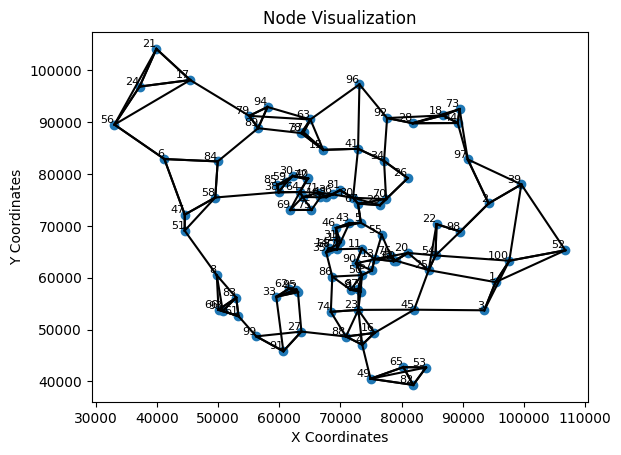

In [5]:
plt.scatter(x, y)
plt.xlabel('X Coordinates')
plt.ylabel('Y Coordinates')
plt.title('Node Visualization')
for i, (x_coord, y_coord) in enumerate(zip(x, y)):
    plt.text(x_coord, y_coord, str(i+1), fontsize=8, verticalalignment='bottom', horizontalalignment='right')
for _, row in Connection_df.iterrows():
    start_node = row['A']
    end_node = row['B']
    plt.plot([x[start_node], x[end_node]], [y[start_node], y[end_node]], 'k-')
plt.show()

In [6]:
import numpy as np
import pandas as pd

def calculate_capacity(node_df, connection_df, min_population=5000, max_population=15000):
    # Assign population to each node using normal distribution
    np.random.seed(42)  # Set a seed for reproducibility
    node_df['Population'] = np.random.randint(min_population, max_population, size=len(node_df))

    # Calculate capacity of each connection by summing node populations
    connection_df['capacity'] = node_df.loc[connection_df['A'], 'Population'].values + \
                                node_df.loc[connection_df['B'], 'Population'].values

    # Create a DataFrame with 'init_node', 'term_node', and 'capacity' columns
    connection_df['capacity'] = connection_df['capacity'].astype(float)  # Convert capacity to float

    output_df = connection_df[['A', 'B', 'capacity']].rename(columns={'A': 'init_node', 'B': 'term_node'})

    return output_df

In [7]:
Data = calculate_capacity(Node_df, Connection_df)

In [8]:
import pandas as pd
import networkx as nx
import concurrent.futures

# Read the DataFrame with connections and capacities
df = Data

# Create a directed graph
G = nx.DiGraph()

# Convert capacity to integers
df['capacity'] = df['capacity'].astype(float)

# Add nodes to the graph
G.add_nodes_from(df['init_node'])
G.add_nodes_from(df['term_node'])

# Add edges to the graph with capacities as edge attributes
for _, row in df.iterrows():
    init_node = row['init_node']
    term_node = row['term_node']
    capacity = row['capacity']
    G.add_edge(init_node, term_node, capacity=capacity)

# Function to find all shortest paths for a pair of nodes
def find_shortest_paths(start_node, end_node):
    return list(nx.all_shortest_paths(G, start_node, end_node, weight='capacity'))

# Find all possible routes and select all shortest paths for each pair of nodes
routes = []
with concurrent.futures.ThreadPoolExecutor() as executor:
    future_to_pair = {executor.submit(find_shortest_paths, start_node, end_node): (start_node, end_node) for start_node in G.nodes for end_node in G.nodes}
    for future in concurrent.futures.as_completed(future_to_pair):
        pair = future_to_pair[future]
        try:
            shortest_paths = future.result()
            for path in shortest_paths:
                route_capacity = min(G[u][v]['capacity'] for u, v in zip(path, path[1:]))
                routes.append({'start_node': pair[0], 'end_node': pair[1], 'route': path, 'capacity': route_capacity})
        except Exception as e:
            print(f"An error occurred for pair {pair}: {e}")

# Convert routes to a DataFrame
Routes_df = pd.DataFrame(routes)
Routes_df['route'] = Routes_df['route'].apply(lambda route: [int(node) for node in route])

# Print the routes DataFrame
Routes_df['route_pairs'] = Routes_df['route'].apply(lambda route: [f"{node}-{next_node}" for node, next_node in zip(route, route[1:])])

An error occurred for pair (61, 27): Target 27 cannot be reached from given sources
An error occurred for pair (35, 89): Target 89 cannot be reached from given sources
An error occurred for pair (74, 1): Target 1 cannot be reached from given sources
An error occurred for pair (61, 26): Target 26 cannot be reached from given sources
An error occurred for pair (35, 88): Target 88 cannot be reached from given sources
An error occurred for pair (52, 66): Target 66 cannot be reached from given sources
An error occurred for pair (73, 100): Target 100 cannot be reached from given sources
An error occurred for pair (61, 25): Target 25 cannot be reached from given sources
An error occurred for pair (35, 87): Target 87 cannot be reached from given sources
An error occurred for pair (73, 99): Target 99 cannot be reached from given sources
An error occurred for pair (61, 24): Target 24 cannot be reached from given sources
An error occurred for pair (16, 30): Target 30 cannot be reached from given 

In [9]:
def find_distance(pair):
    node1, node2 = pair.split('-')
    x1 = Node_df.iloc[int(node1) - 1]['X']
    x2 = Node_df.iloc[int(node2) - 1]['X']
    y1 = Node_df.iloc[int(node1) - 1]['Y']
    y2 = Node_df.iloc[int(node2) - 1]['Y']
    return ((x1-x2)**2 + (y1-y2)**2)**0.5

distances = dict()
for i in range(len(Data)):
    distance = f"{int(Data.iloc[i]['init_node'])}-{int(Data.iloc[i]['term_node'])}"
    distances[distance] = find_distance(distance)

    
# Function to calculate the summary distance for a route pair
def calculate_summary_distance(route_pairs):
    return sum(distances.get(pair, 0) for pair in route_pairs)

# Calculate the summary distances for each route_pairs entity
Routes_df['summary_distance'] = Routes_df['route_pairs'].apply(calculate_summary_distance)

# Print the updated routes DataFrame with summary distances
# print(routes_df)


In [79]:
max_distance = 20000 # for example
n_clusters = 100

import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
def fff(max_distance, n_clusters):
    # Set the max_distance a car can drive without charging

    # Filter routes that a car can drive without charging
    viable_routes_df = Routes_df[Routes_df['summary_distance'] <= max_distance]

    if viable_routes_df.empty:
        raise ValueError("No viable routes! Increase max_distance.")

    # Now, we'll perform clustering on the 'capacity' of the routes
    # Convert 'capacity' into a 2D numpy array
    X = np.array(viable_routes_df['capacity']).reshape(-1, 1)

    # Number of clusters corresponds to the number of desired charging stations

    kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(X)

    # Assign each route to a cluster
    viable_routes_df['cluster'] = kmeans.labels_

    charging_stations = []

    # For each cluster, find the route with the maximum capacity
    for i in range(n_clusters):
        cluster_routes = viable_routes_df[viable_routes_df['cluster'] == i]

        if cluster_routes.empty:
            continue  # Skip to the next iteration if there are no routes in this cluster

        # Choose the first route with the maximum capacity
        best_route = cluster_routes[cluster_routes['capacity'] == cluster_routes['capacity'].max()].iloc[0]

        # Choose the node with the highest capacity within this route
        nodes_in_route = best_route['route']
        node_capacities = [(node, Routes_df[Routes_df['start_node'] == node]['capacity'].max()) for node in nodes_in_route]
        best_node, _ = max(node_capacities, key=lambda x: x[1])

        # Add the best_node's coordinates to the list of charging stations
        charging_stations.append(Node_df.loc[int(best_node)])

    # Now charging_stations contains the coordinates of the charging stations.
    #print(charging_stations)

    capacities = dict()
    for i in range(len(Data)):
        if Data['term_node'][i] not in capacities.keys():
            capacities[Data['term_node'][i]] = Data['capacity'][i]
        else:
            capacities[Data['term_node'][i]] += Data['capacity'][i]  


    # # Convert charging_stations to a dictionary for uniqueness
    # charging_stations_dict = {station.name: station for station in charging_stations}

    # # Store the original number of charging stations
    # original_num_stations = len(charging_stations_dict)

    # # Sort the capacities dict based on values (in descending order)
    # sorted_capacities = dict(sorted(capacities.items(), key=lambda item: item[1], reverse=True))

    # # Iterate over the sorted capacities dict
    # for node, capacity in sorted_capacities.items():
    #     # If the node is not already in the charging_stations dictionary
    #     if int(node) not in charging_stations_dict:
    #         # Get the node from node_df and add it to the charging_stations dictionary
    #         charging_stations_dict[int(node)] = Node_df.loc[int(node)]

    #     # Check if the number of charging stations is equal to n_clusters
    #     if len(charging_stations_dict) == n_clusters:
    #         break

    # # Convert the dictionary back to a list
    # charging_stations = list(charging_stations_dict.values())

    # # Calculate the number of new stations added
    # num_new_stations = len(charging_stations) - original_num_stations

    # if num_new_stations == 0 and len(charging_stations) < n_clusters:
    #     print("Not enough different stations to reach the desired number of clusters.")
    # else:
    #     print(f"Added {num_new_stations} new station(s) to charging_stations list.")

    import matplotlib.pyplot as plt

    plt.scatter(x, y)
    plt.xlabel('X Coordinates')
    plt.ylabel('Y Coordinates')
    plt.title('Node Visualization')
    for i, (x_coord, y_coord) in enumerate(zip(x, y)):
        plt.text(x_coord, y_coord, str(i+1), fontsize=8, verticalalignment='bottom', horizontalalignment='right')

    # Extracting X and Y coordinates of charging stations
    x_charging = [station['X'] for station in charging_stations]
    y_charging = [station['Y'] for station in charging_stations]

    # Plotting charging stations
    plt.scatter(x_charging, y_charging, color='red')

    for _, row in Connection_df.iterrows():
        start_node = row['A']
        end_node = row['B']
        plt.plot([x[start_node], x[end_node]], [y[start_node], y[end_node]], 'k-')

    plt.show()

    def get_node_numbers(charging_stations, Node_df):
        node_numbers = []
        for station in charging_stations:
            match = Node_df[(Node_df['X'] == station['X']) & (Node_df['Y'] == station['Y'])]
            node_numbers.append(match.index[0])
        return node_numbers

    # Call the function with your data
    node_numbers = get_node_numbers(charging_stations, Node_df)

    # Print the node numbers of the charging stations
    print(len(node_numbers))

    def find_distances(route_pairs, node_numbers, distances_dict, max_distance):
        route_nodes = []
        charging_stations = []
        distances = []

        # Extract nodes from route pairs and add to route_nodes
        for route_pair in route_pairs:
            node_a, node_b = map(int, route_pair.split('-'))
            if node_a not in route_nodes:
                route_nodes.append(node_a)
            if node_b not in route_nodes:
                route_nodes.append(node_b)

        # Determine which nodes are charging stations
        for node in route_nodes:
            if node in node_numbers:
                charging_stations.append(node)

        # Special case when starting point is a charging station
        if route_nodes[0] in charging_stations:
            charging_stations.remove(route_nodes[0])

        if len(charging_stations) == 0:
            # No charging station, return the total route distance
            total_distance = 0
            for i in range(len(route_nodes)-1):
                total_distance += distances_dict[f'{route_nodes[i]}-{route_nodes[i+1]}']
            distances.append(total_distance)
        else:
            # There are charging stations, calculate distances between them
            prev_station = route_nodes[0]
            for station in charging_stations:
                distance = 0
                i = route_nodes.index(prev_station)
                while i < len(route_nodes) and route_nodes[i] != station:
                    distance += distances_dict[f'{route_nodes[i]}-{route_nodes[i+1]}']
                    i += 1
                distances.append(distance)
                prev_station = station

            # Distance from last charging station to end of route
            distance = 0
            i = route_nodes.index(prev_station)
            while i < len(route_nodes) - 1:
                distance += distances_dict[f'{route_nodes[i]}-{route_nodes[i+1]}']
                i += 1
            distances.append(distance)

        return distances
    # Apply the function to the 'route_pairs' column
    Routes_df['distances_between_stations'] = Routes_df['route_pairs'].apply(
        lambda route_pairs: find_distances(
            route_pairs, 
            node_numbers, 
            distances, 
            max_distance
        )
    )
    def count_charging_stations(route_pairs, node_numbers):
        route_nodes = []
        charging_stations = []

        # Extract nodes from route pairs and add to route_nodes
        for route_pair in route_pairs:
            node_a, node_b = map(int, route_pair.split('-'))
            if node_a not in route_nodes:
                route_nodes.append(node_a)
            if node_b not in route_nodes:
                route_nodes.append(node_b)

        # Determine which nodes are charging stations
        for node in route_nodes:
            if node in node_numbers:
                charging_stations.append(node)

        # Special case when starting point is a charging station
        if route_nodes[0] in charging_stations:
            charging_stations.remove(route_nodes[0])

        return len(charging_stations)


    # Apply the function to the 'route_pairs' column
    Routes_df['station_count'] = Routes_df['route_pairs'].apply(
        lambda route_pairs: count_charging_stations(
            route_pairs, 
            node_numbers
        )
    )
    def check_max_distance(distances, max_distance):
        # Check if any distance in distances is greater than max_distance
        for distance in distances:
            if distance > max_distance:
                return False

        # If none of the distances are greater than max_distance
        return True


    # Apply the function to the 'distances_between_stations' column
    Routes_df['within_max_distance'] = Routes_df['distances_between_stations'].apply(
        lambda distances: check_max_distance(distances, max_distance)
    )

    return sum(Routes_df['within_max_distance'])/len(Routes_df)

C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


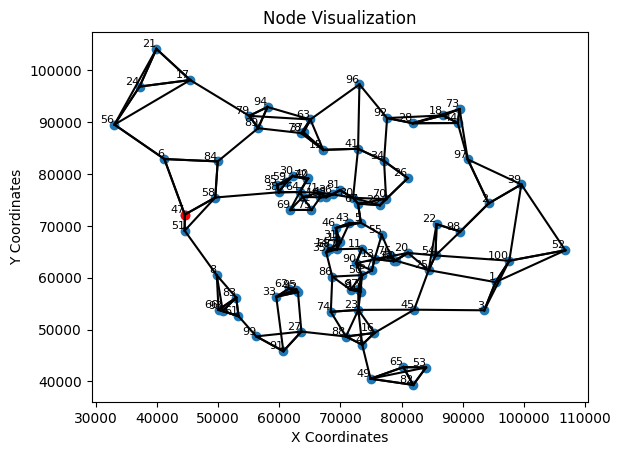

1


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


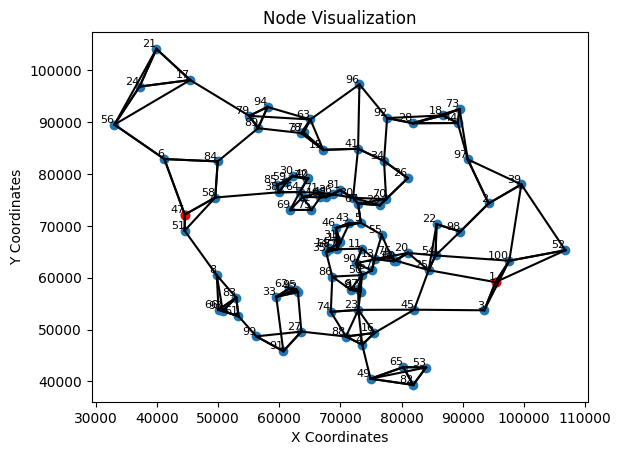

2


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


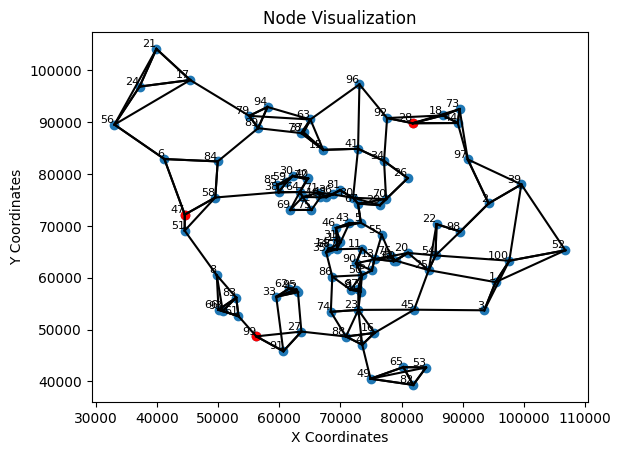

3


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


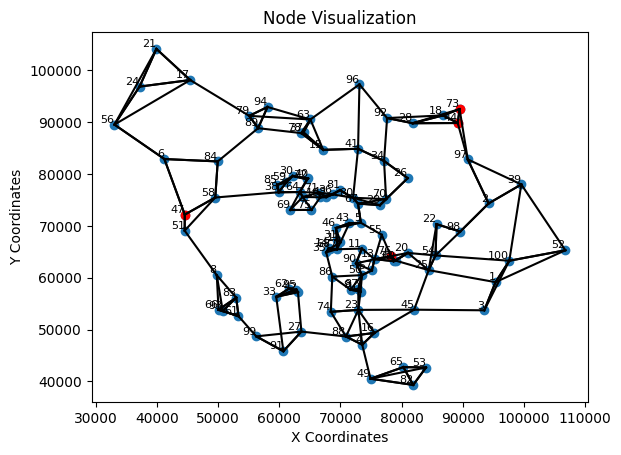

4


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


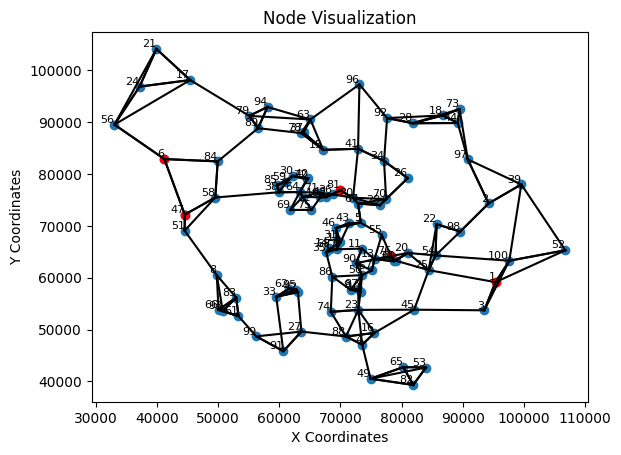

5


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


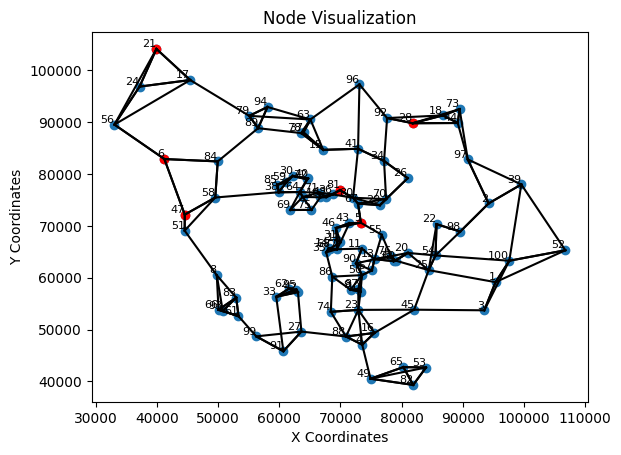

6


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


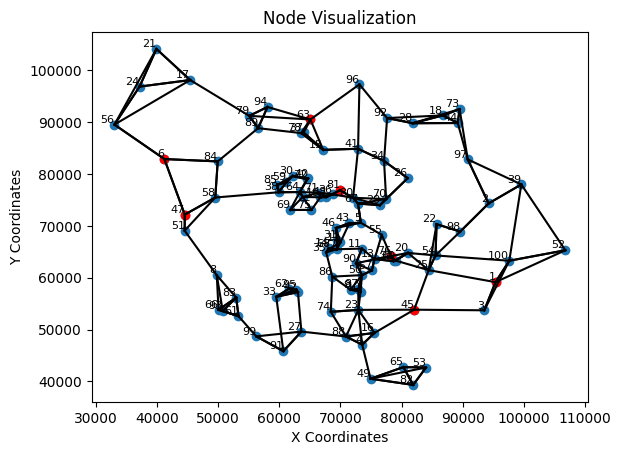

7


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


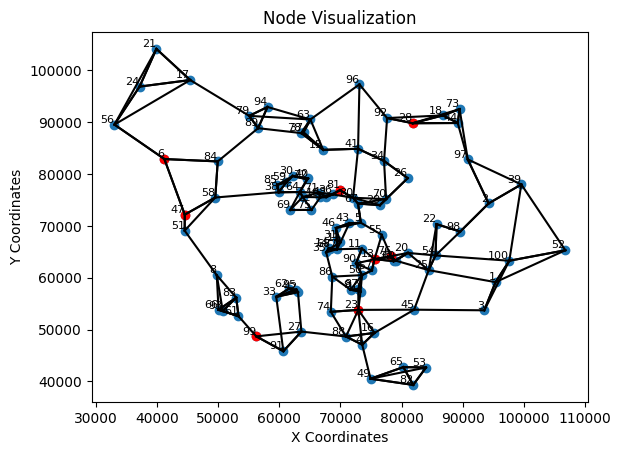

8


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


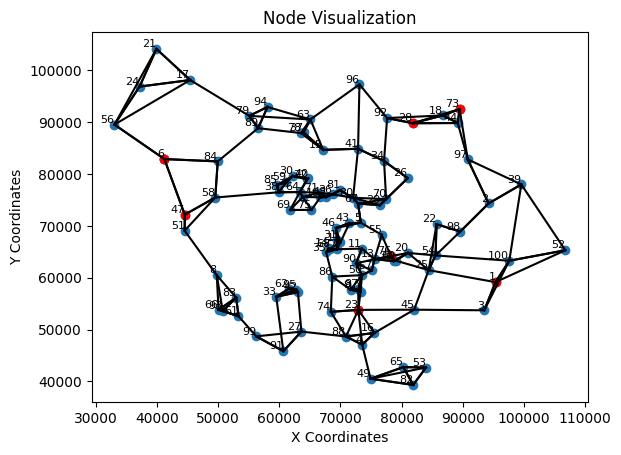

9


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


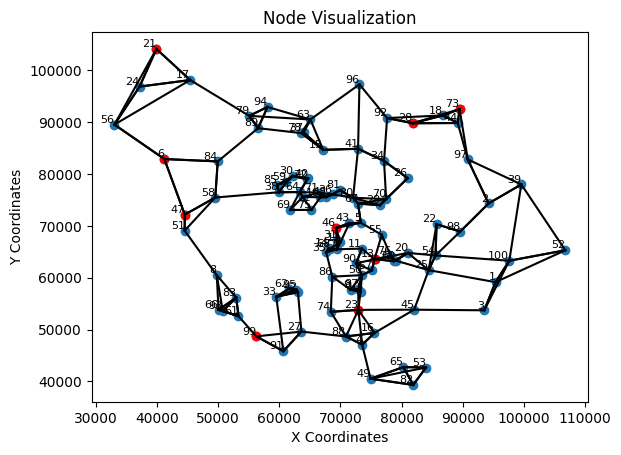

10


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


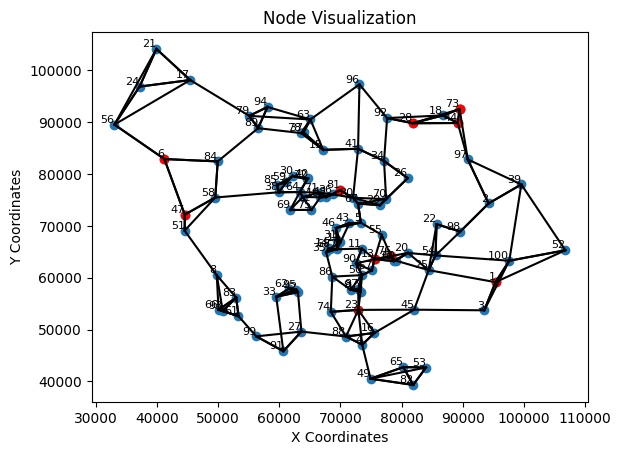

11


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


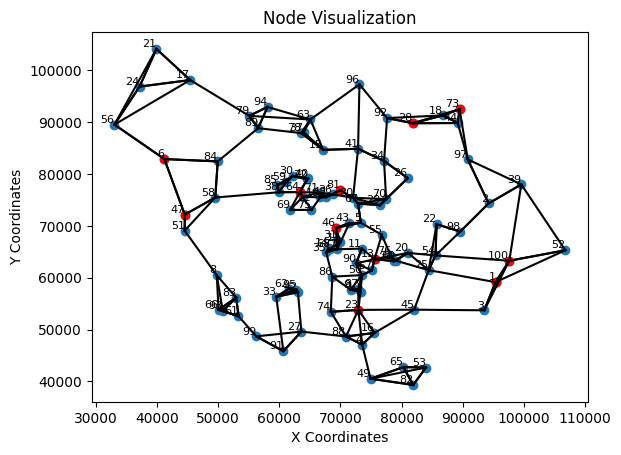

12


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


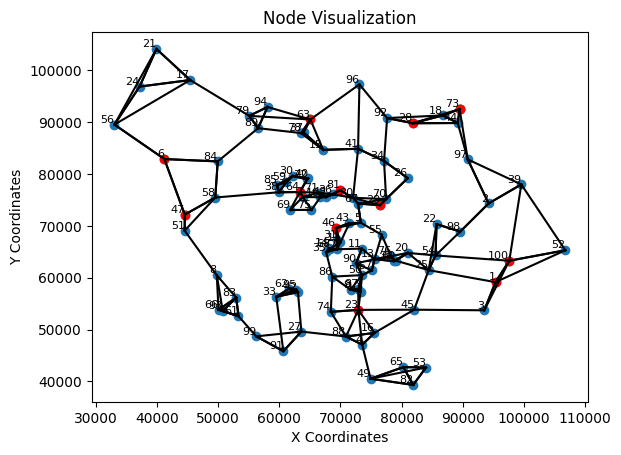

13


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


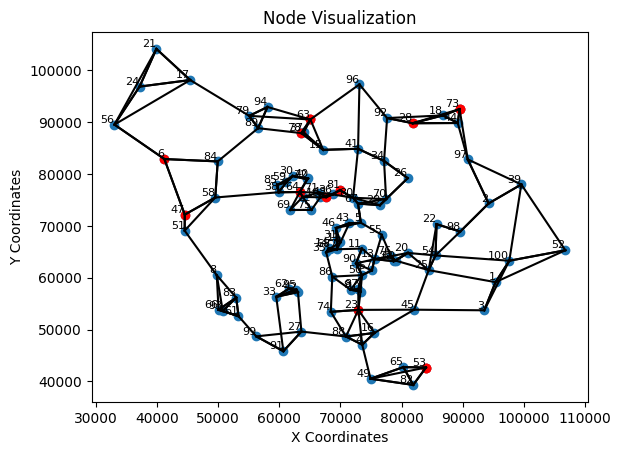

14


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


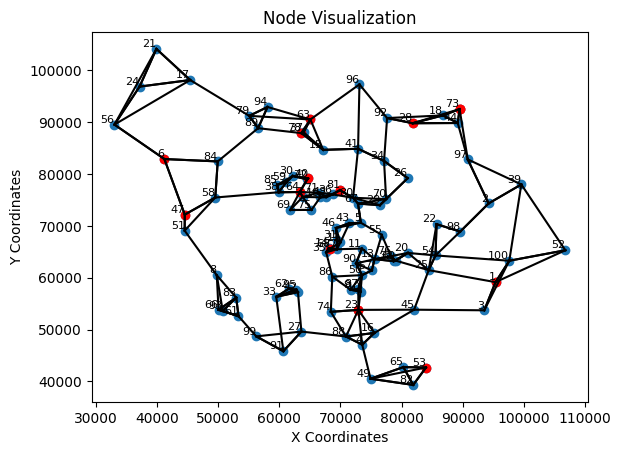

15


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


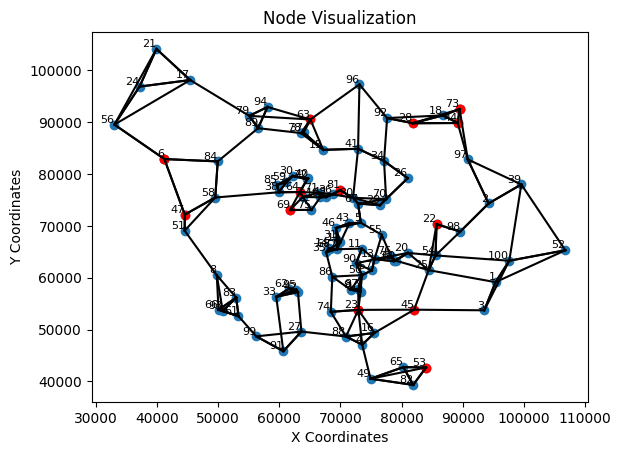

16


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


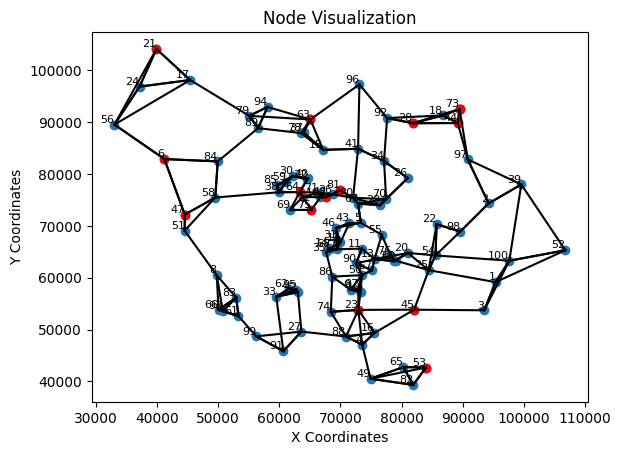

17


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


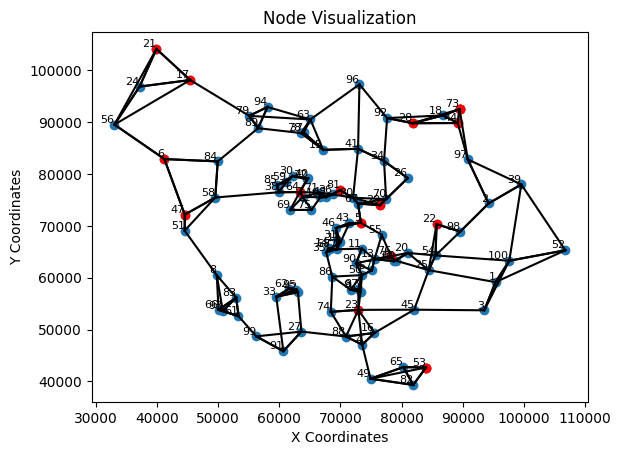

18


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


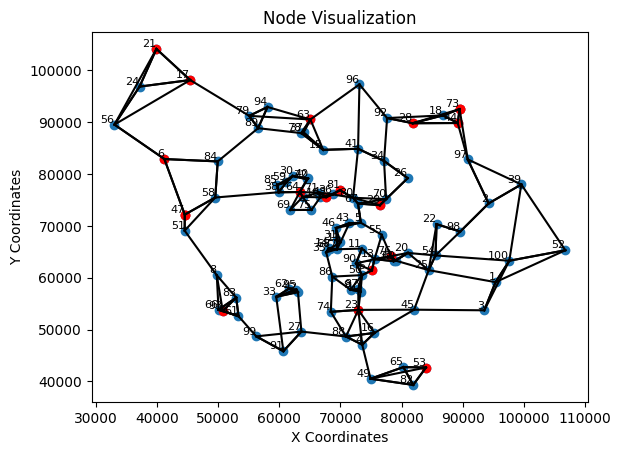

19


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


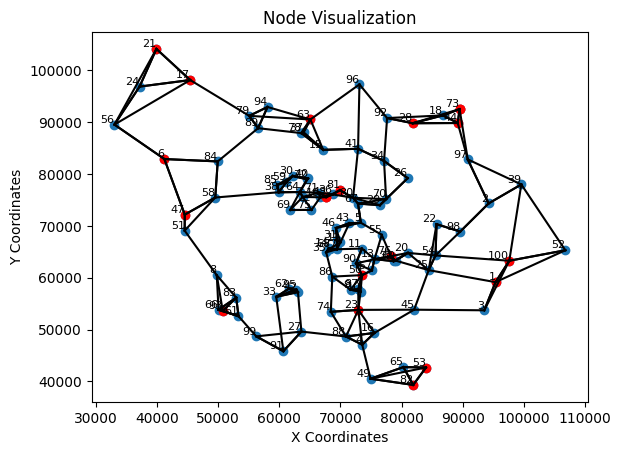

20


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


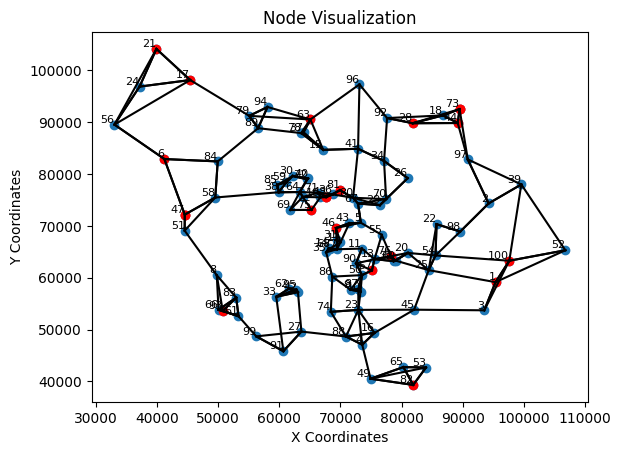

21


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


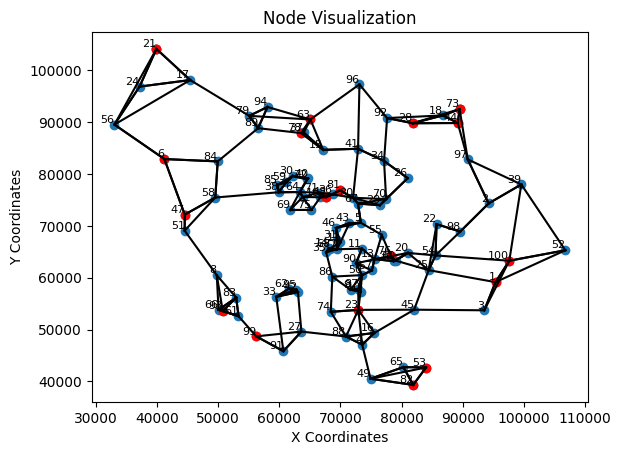

22


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


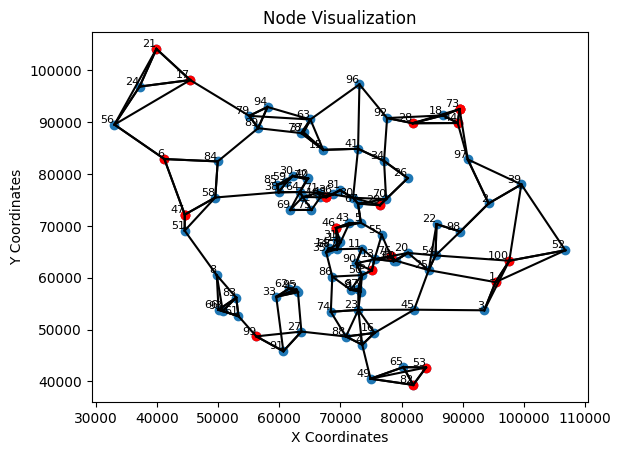

23


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


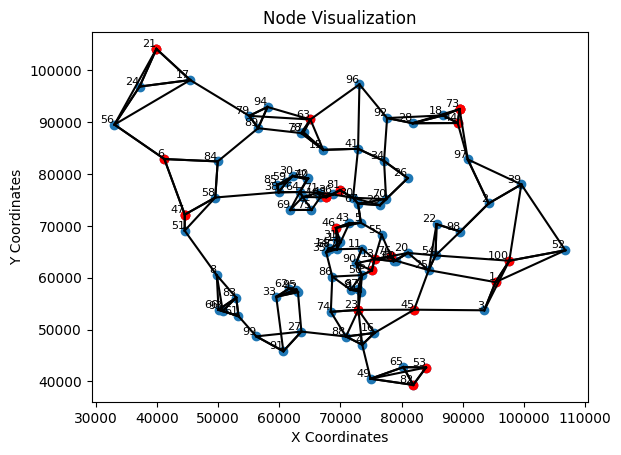

24


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


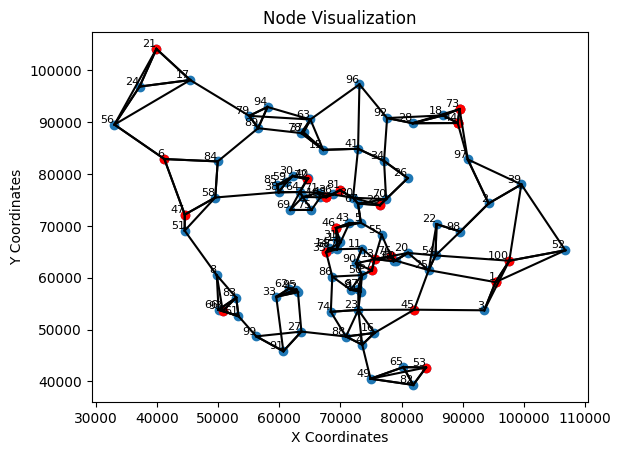

25


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


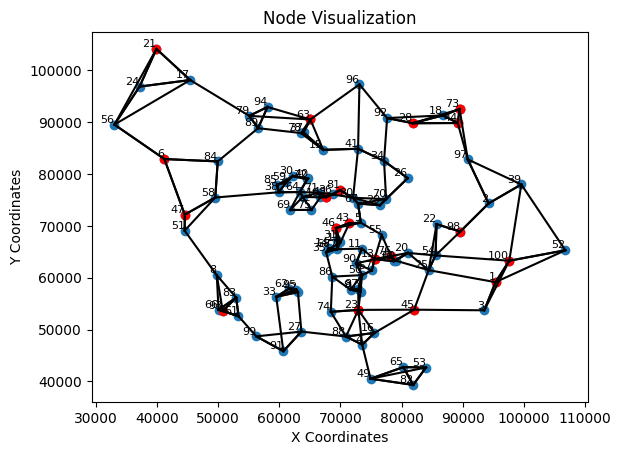

26


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


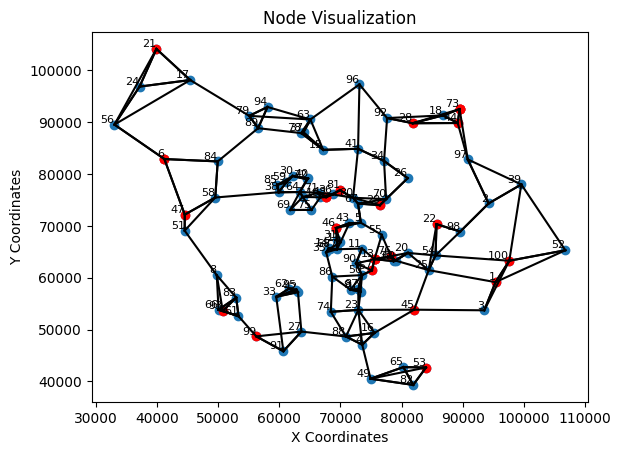

27


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


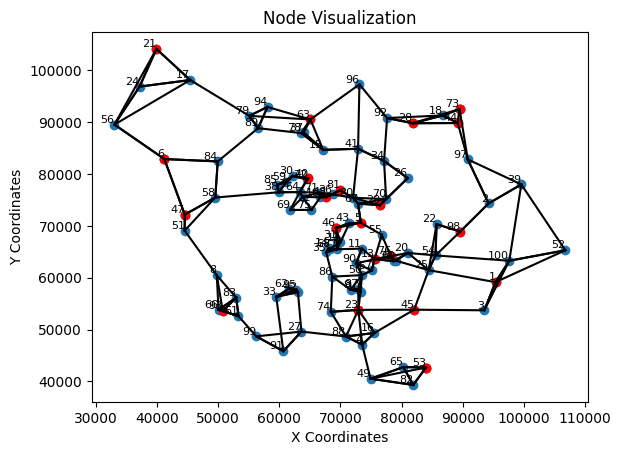

28


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


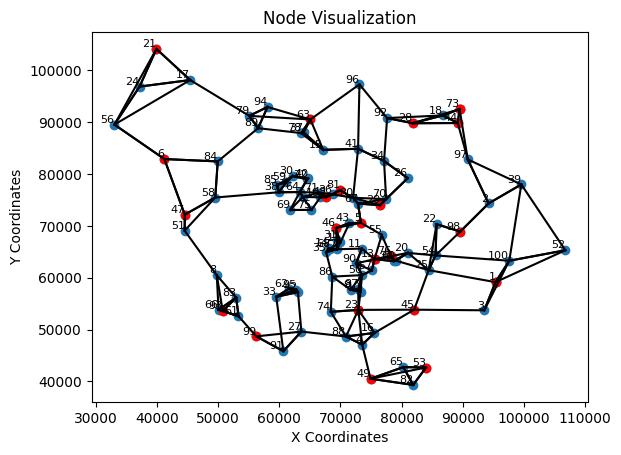

29


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


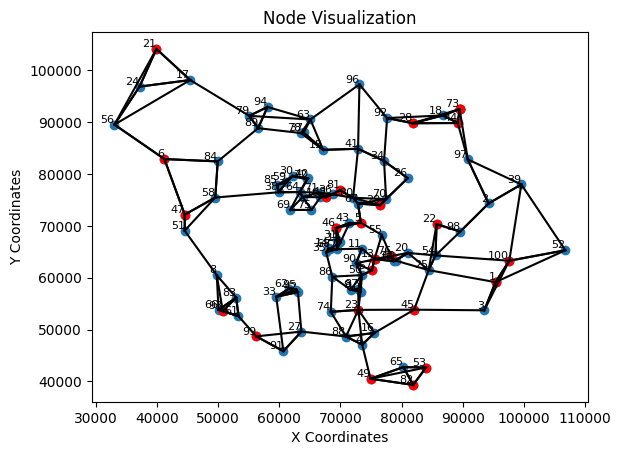

30


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


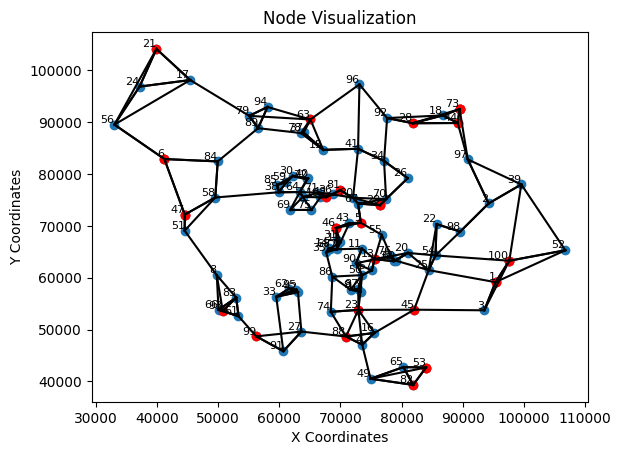

31


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


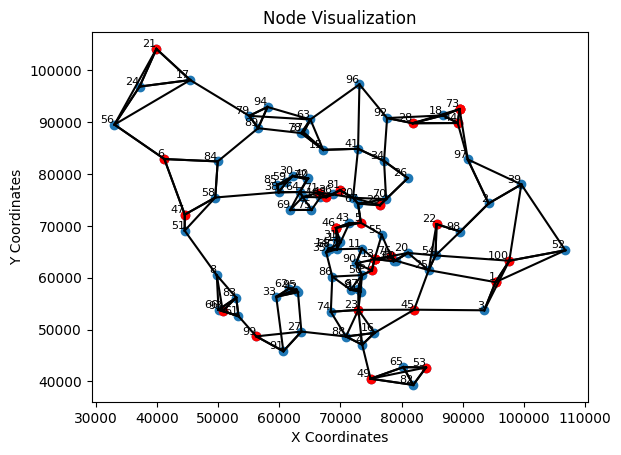

32


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


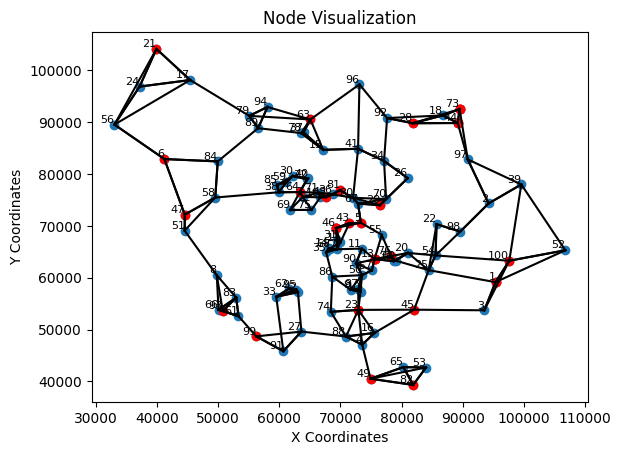

33


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


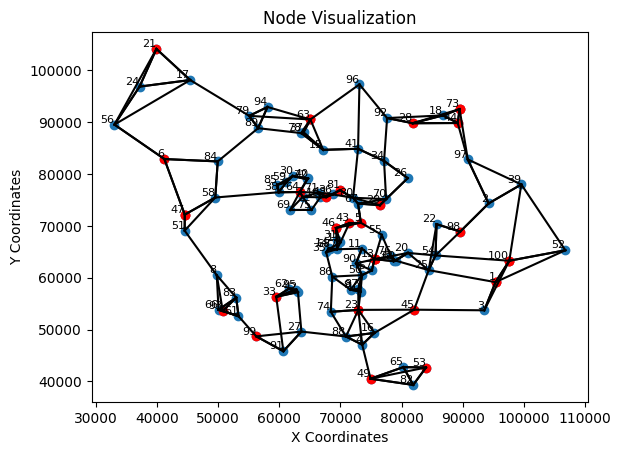

34


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


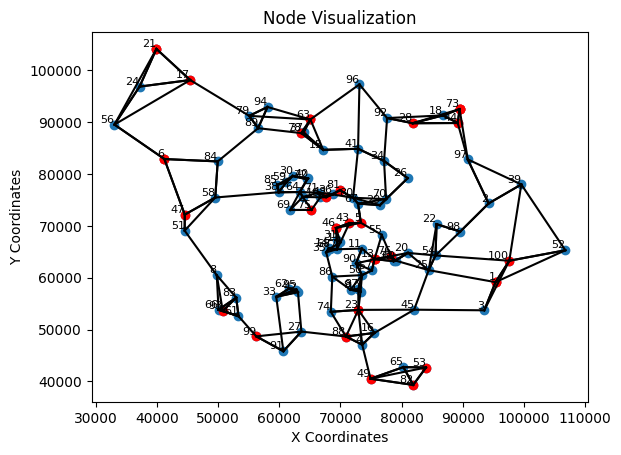

35


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


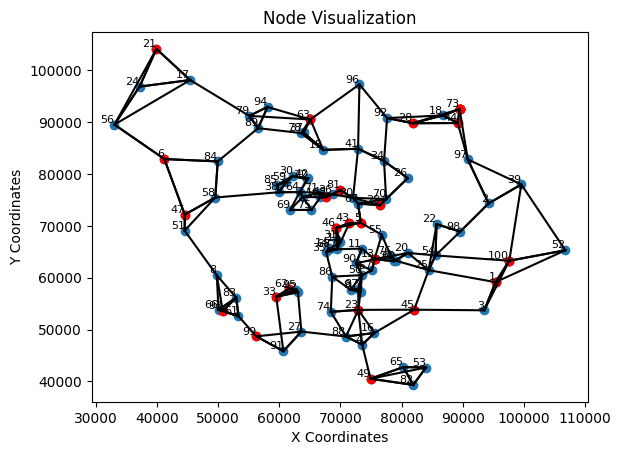

36


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


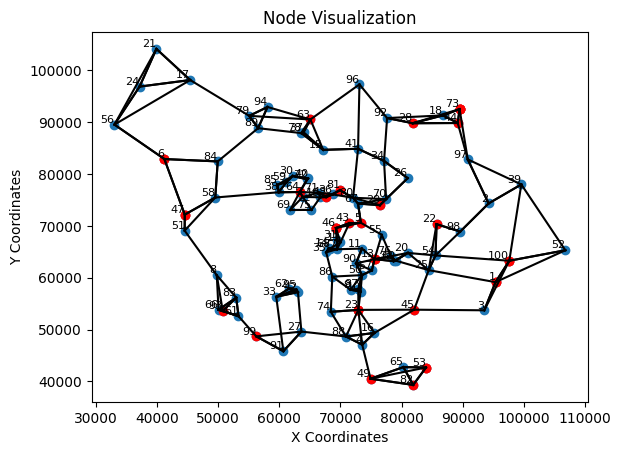

37


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


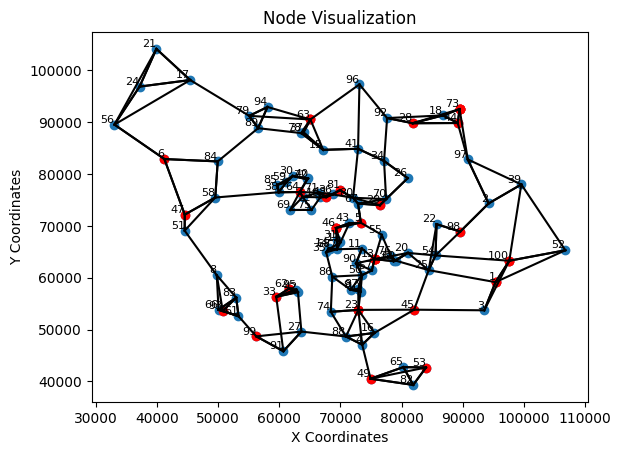

38


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


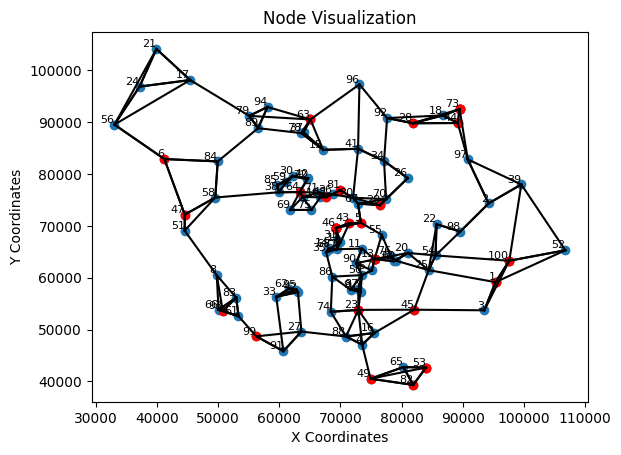

39


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


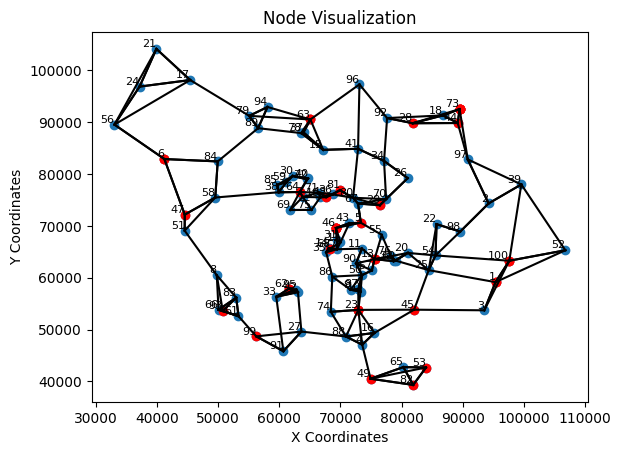

40


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


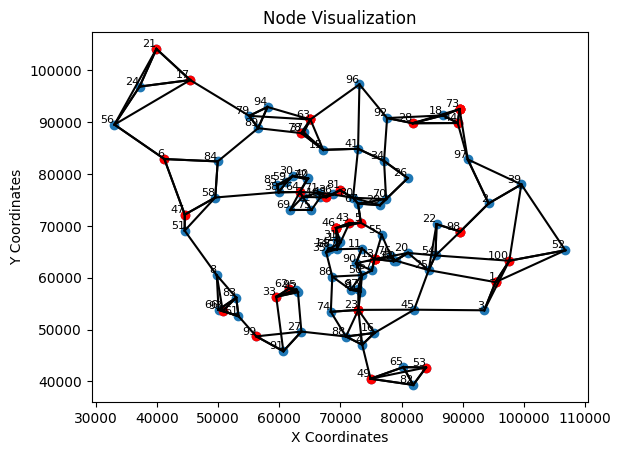

41


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


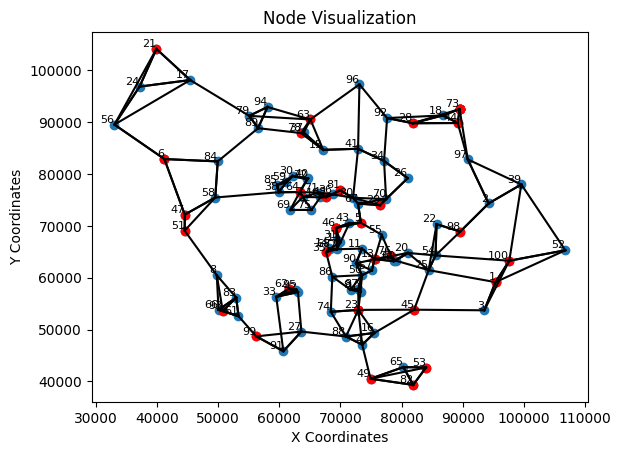

42


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


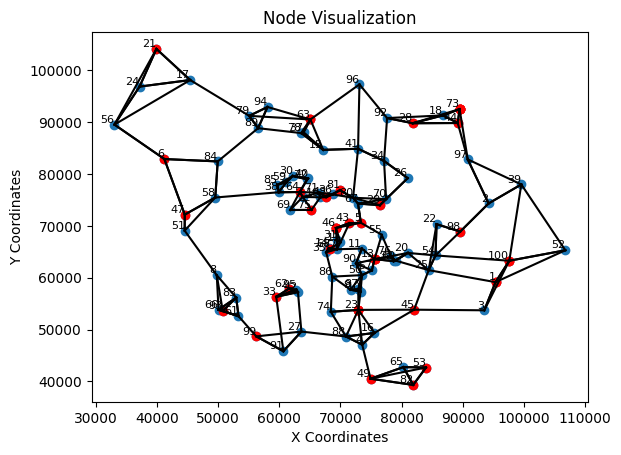

43


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


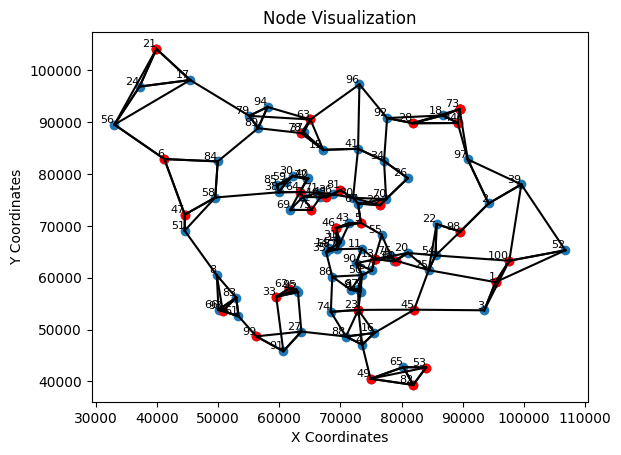

44


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


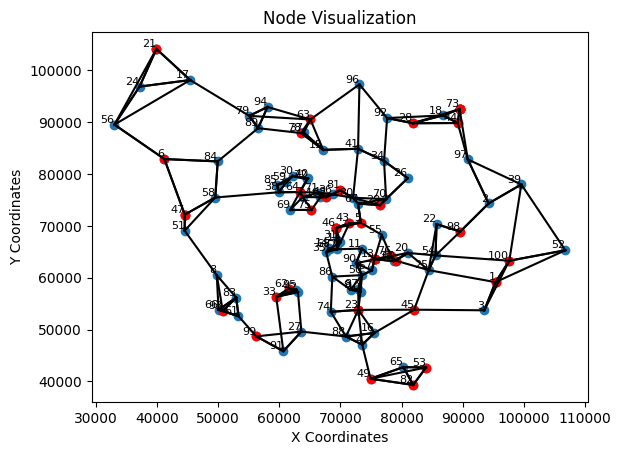

45


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


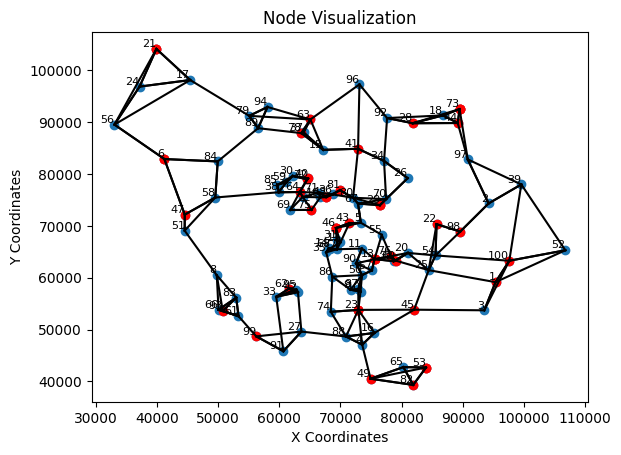

46


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


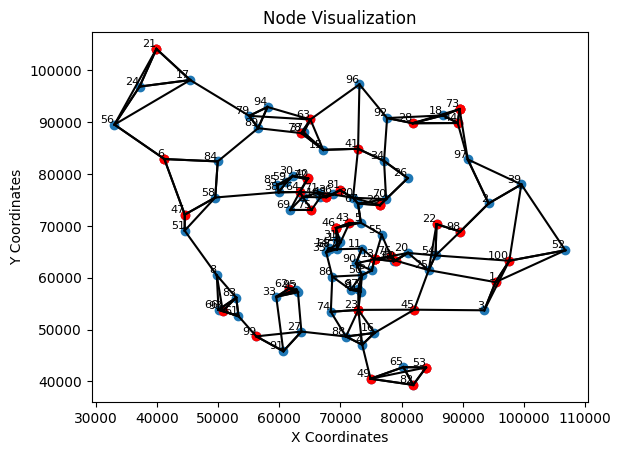

47


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


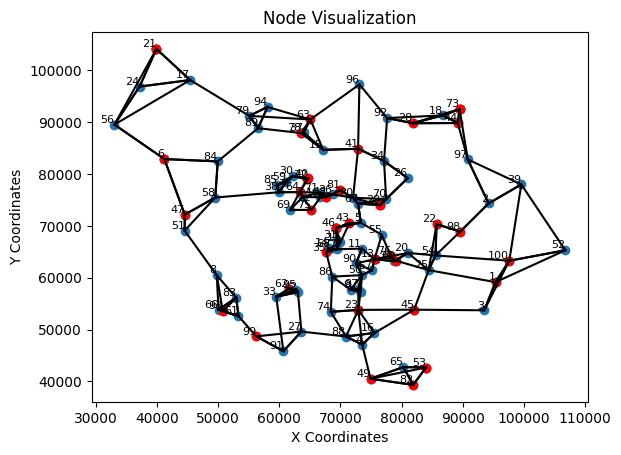

48


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


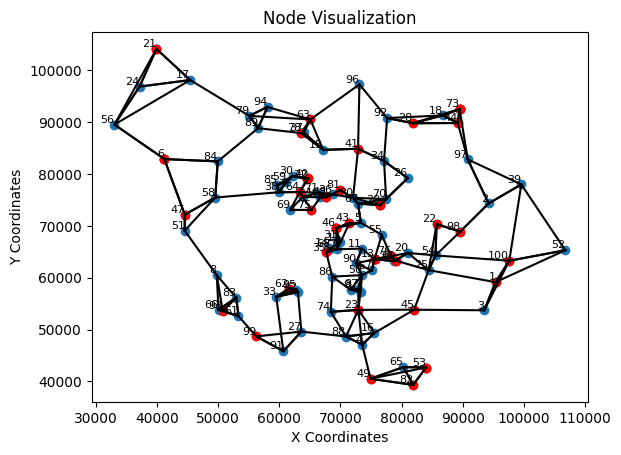

49


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


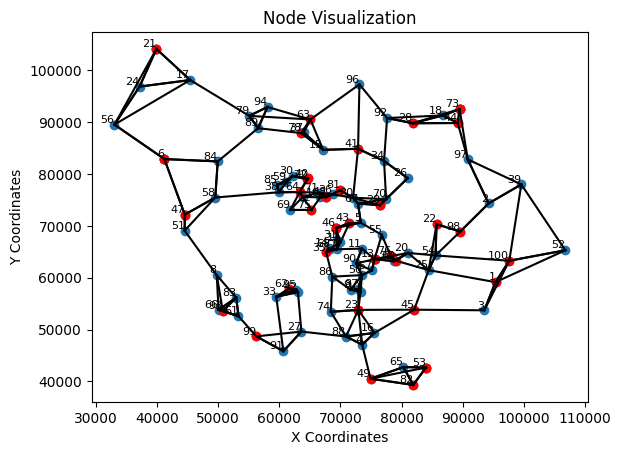

50


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


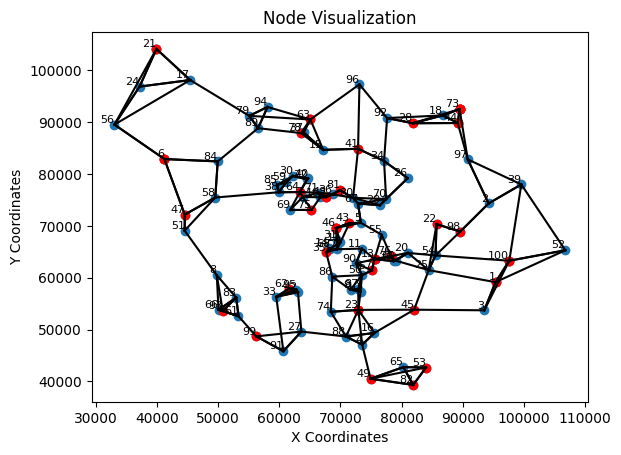

51


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


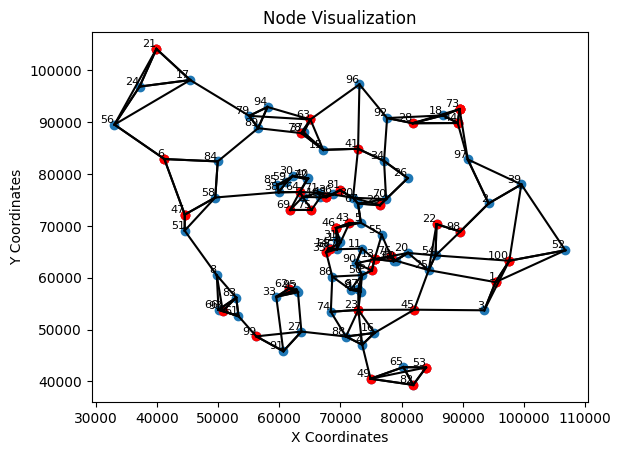

52


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


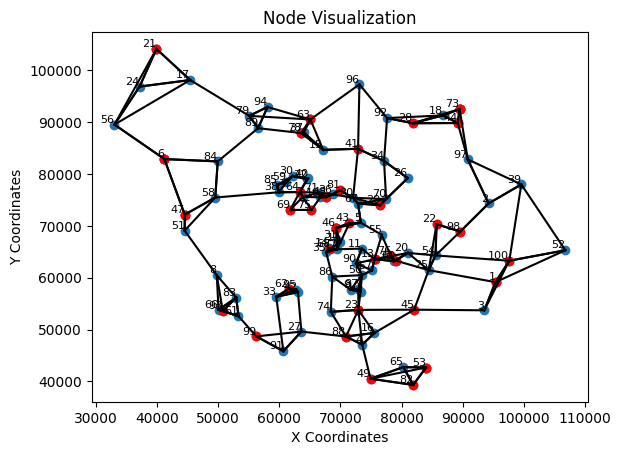

53


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


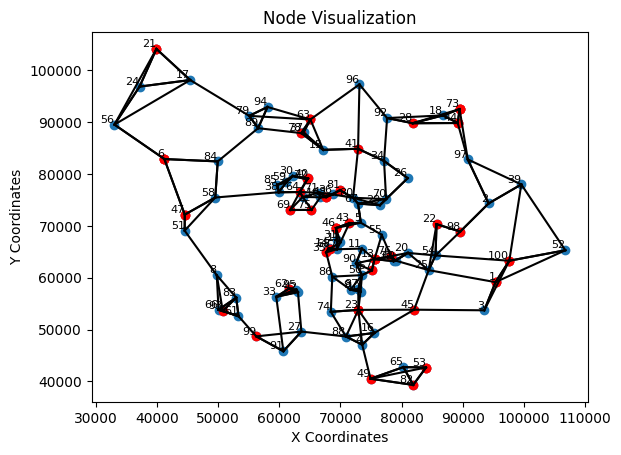

54


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


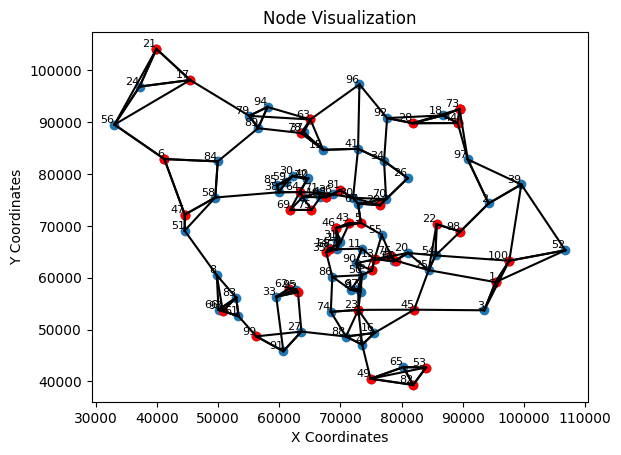

55


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


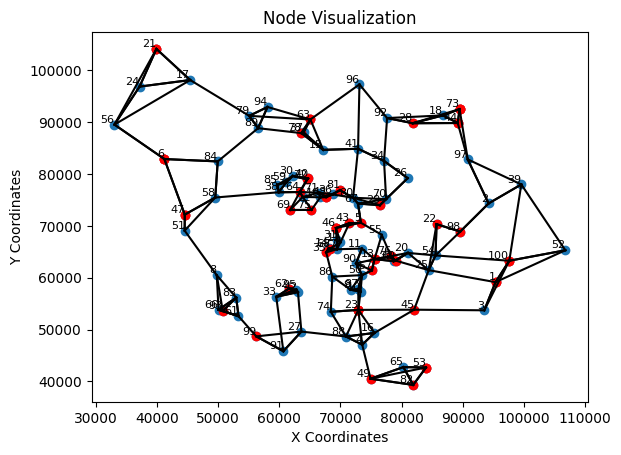

56


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


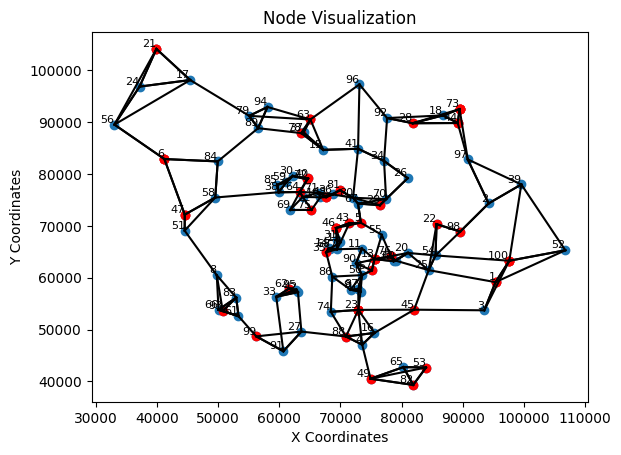

57


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


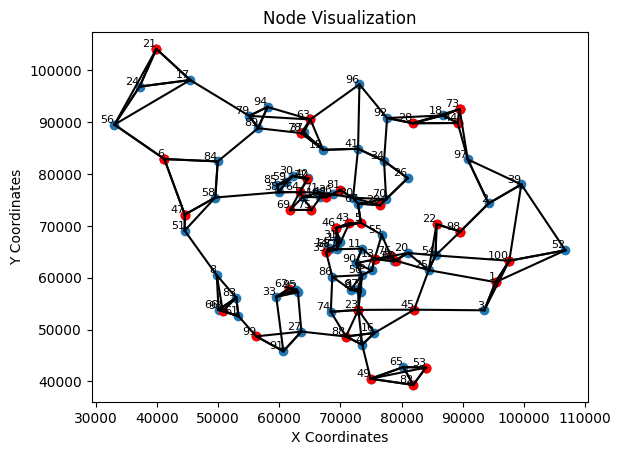

58


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


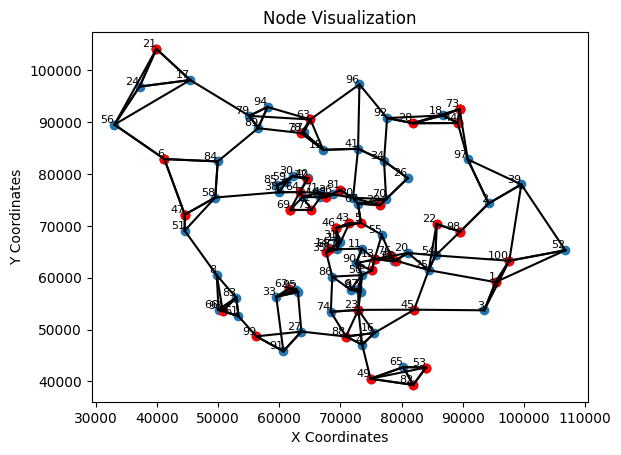

59


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


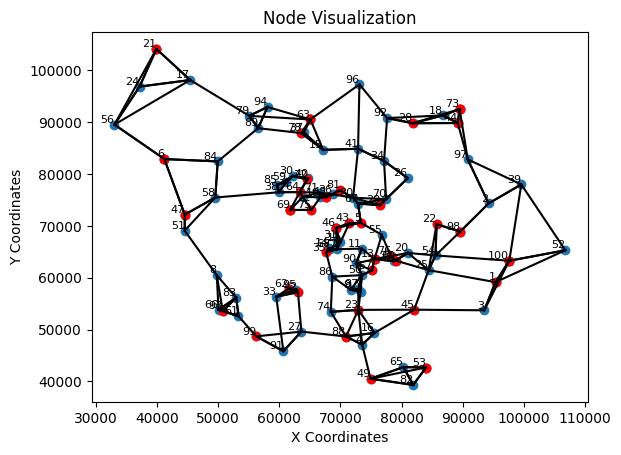

60


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


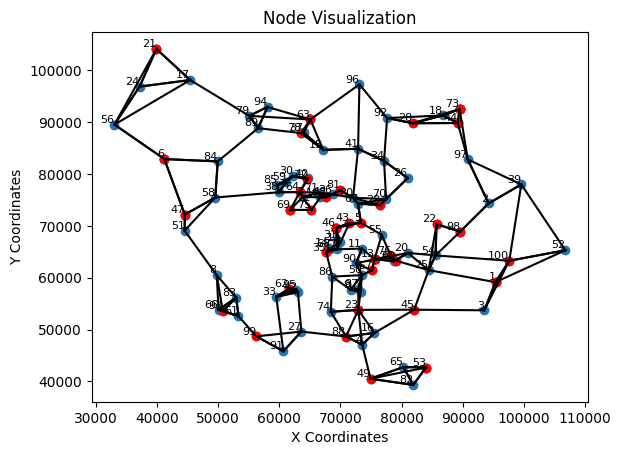

61


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


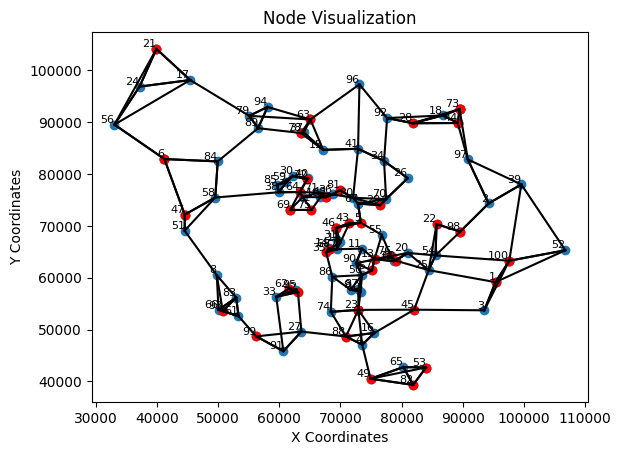

62


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


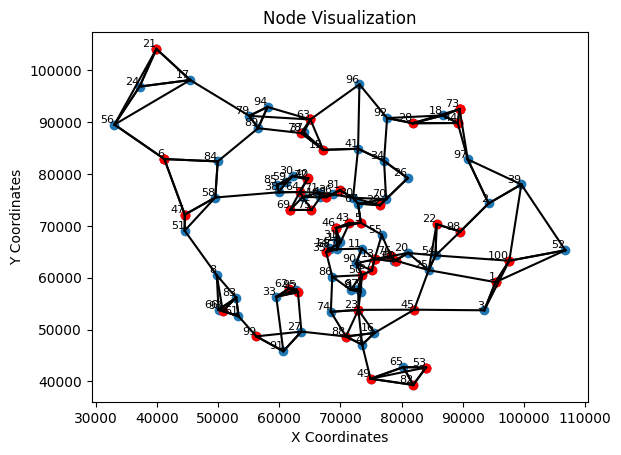

63


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


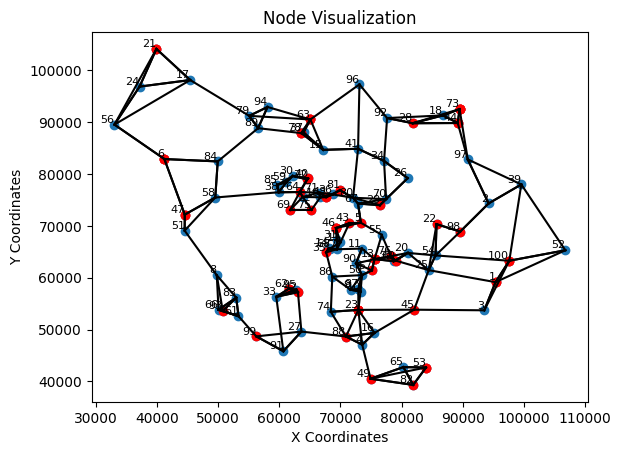

64


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


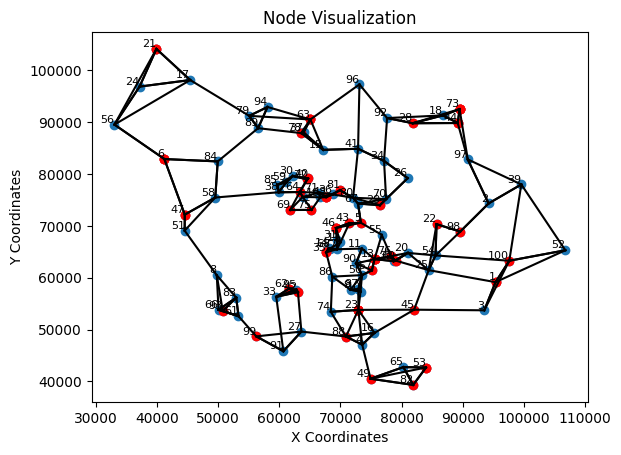

65


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


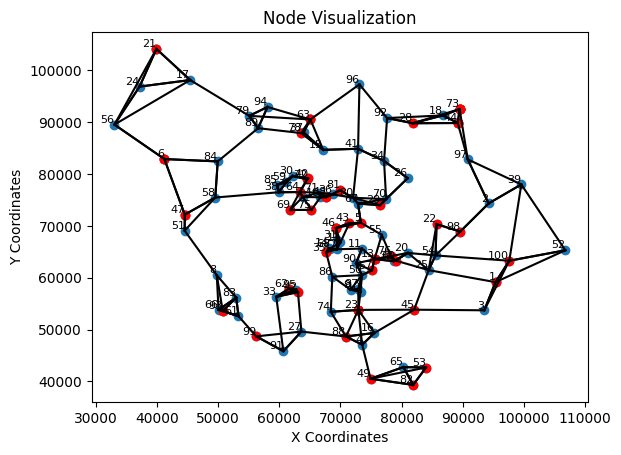

66


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


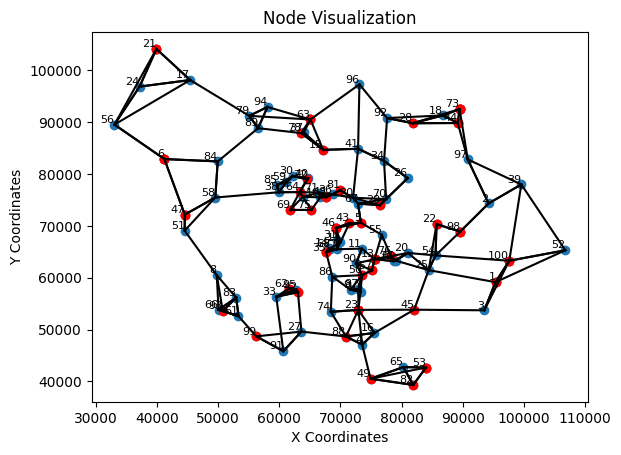

67


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


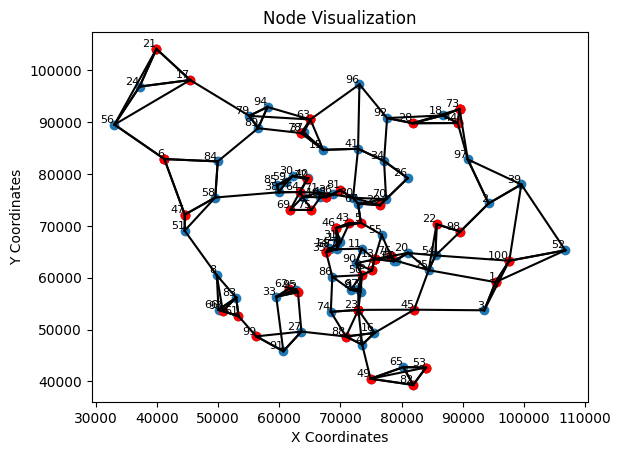

68


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


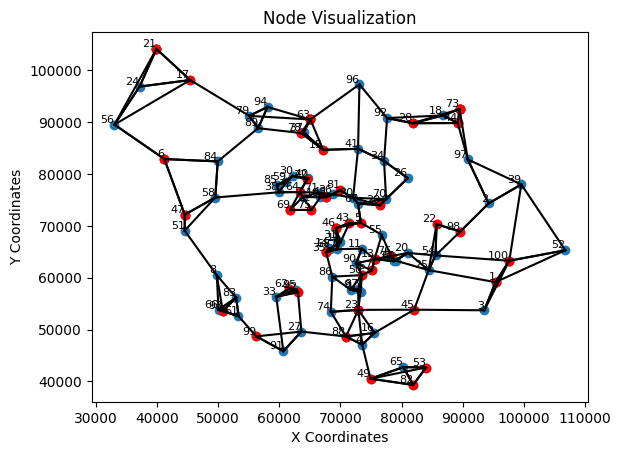

69


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


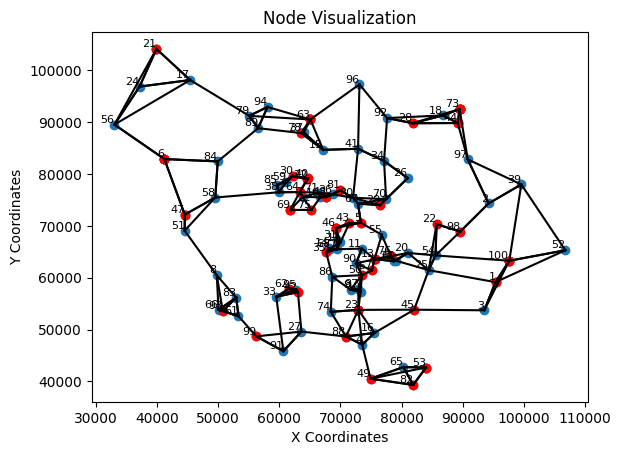

70


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


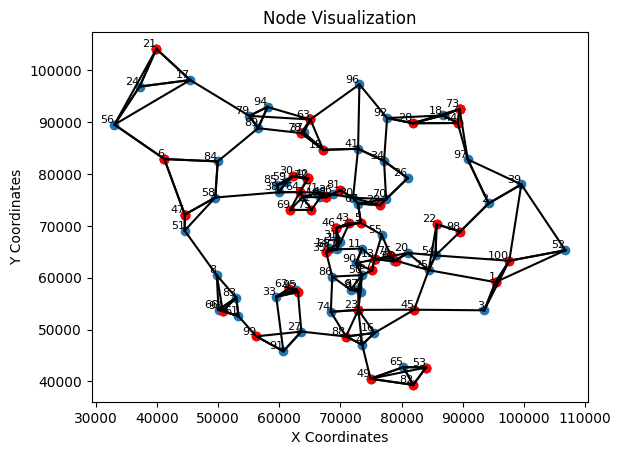

71


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


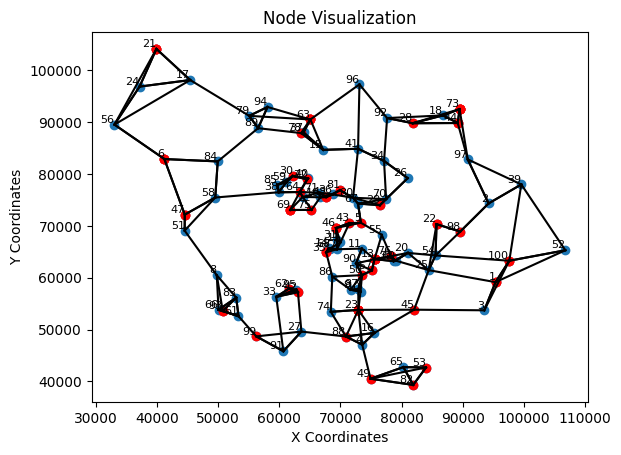

72


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


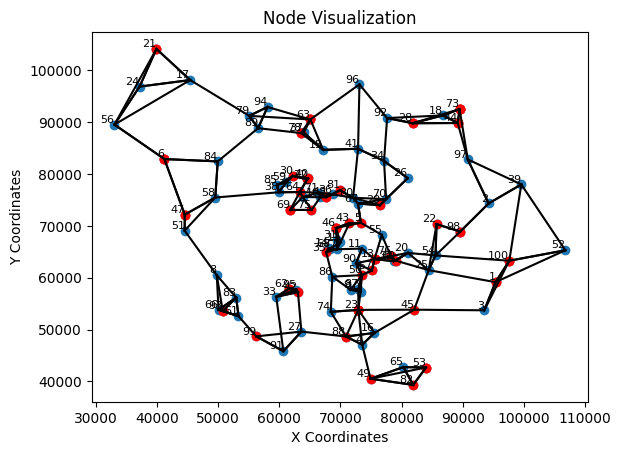

73


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


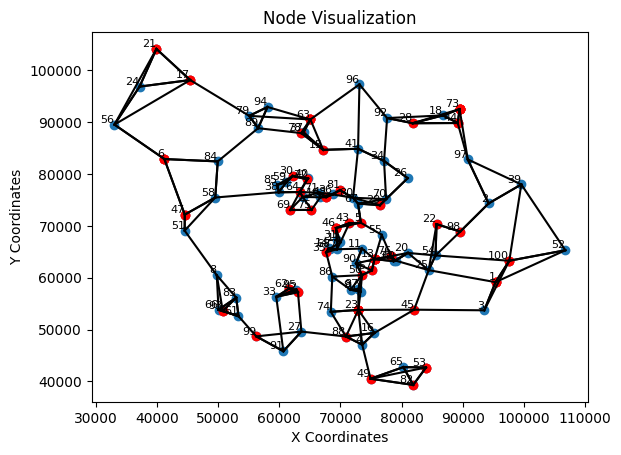

74


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


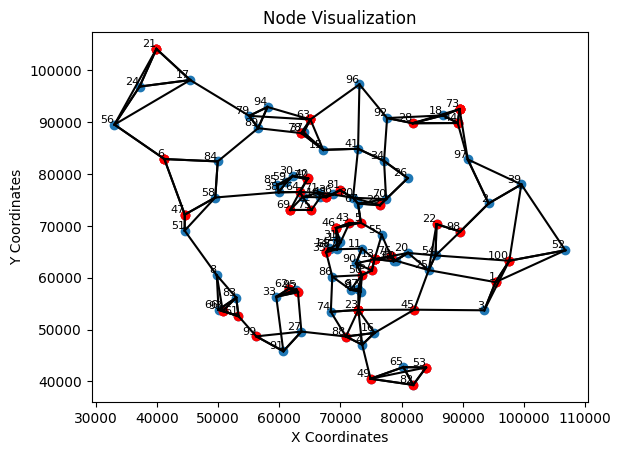

75


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


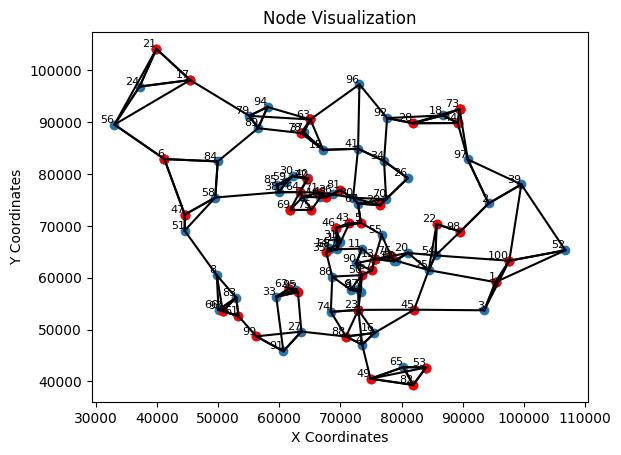

76


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


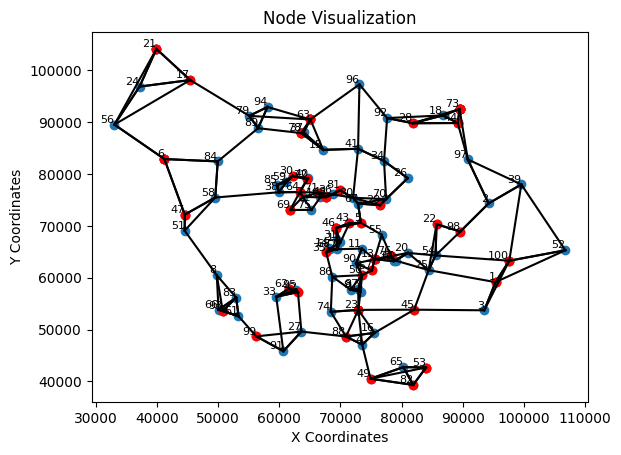

77


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


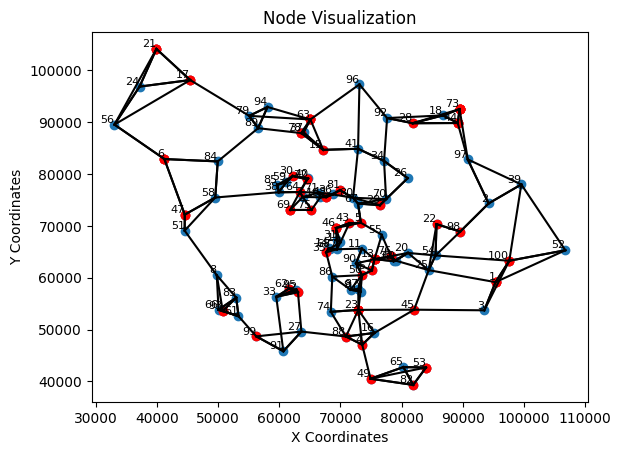

78


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


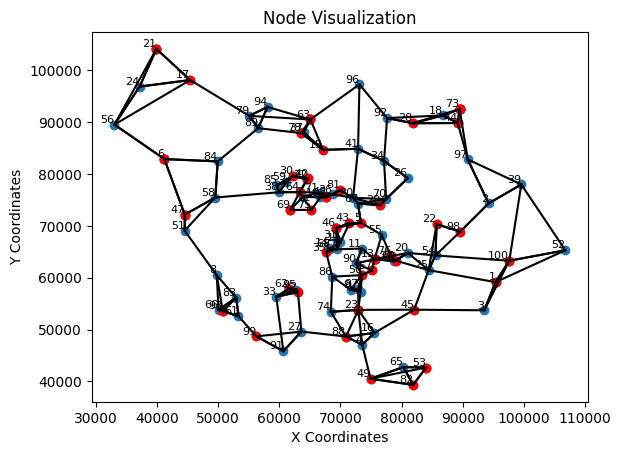

79


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


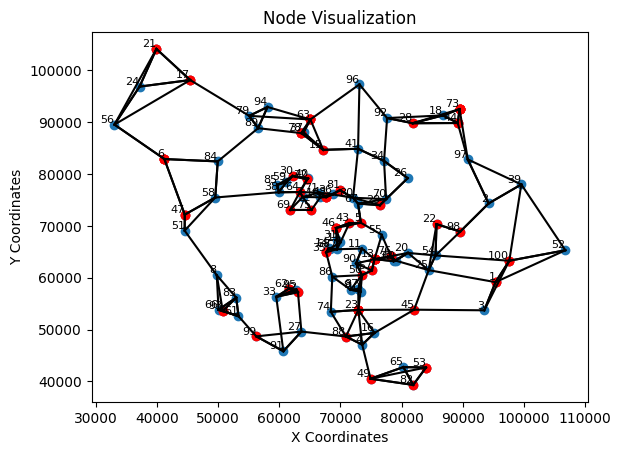

80


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


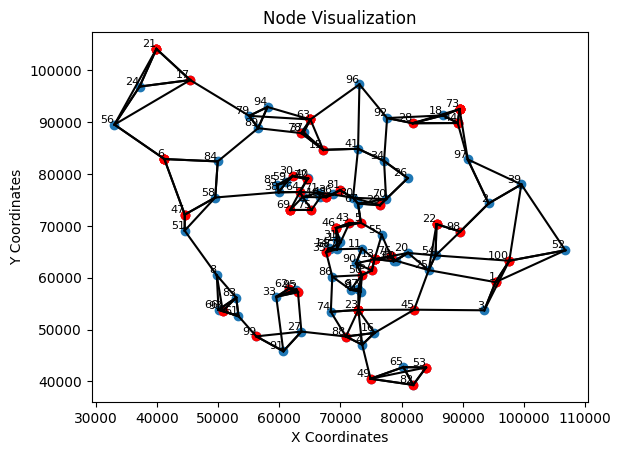

81


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


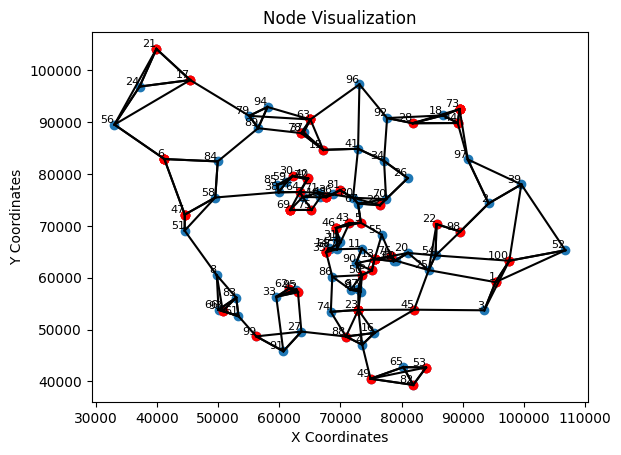

82


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


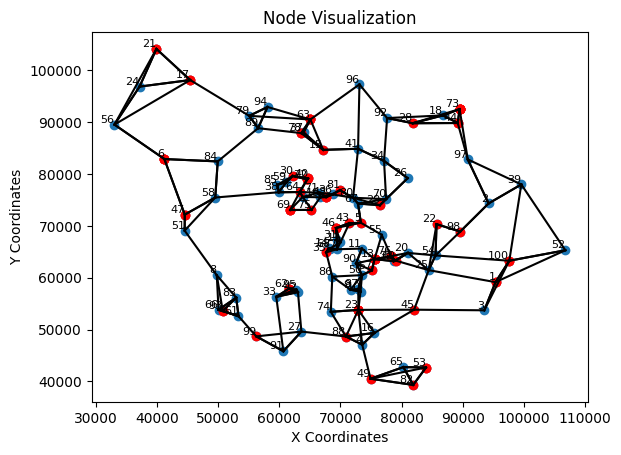

83


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


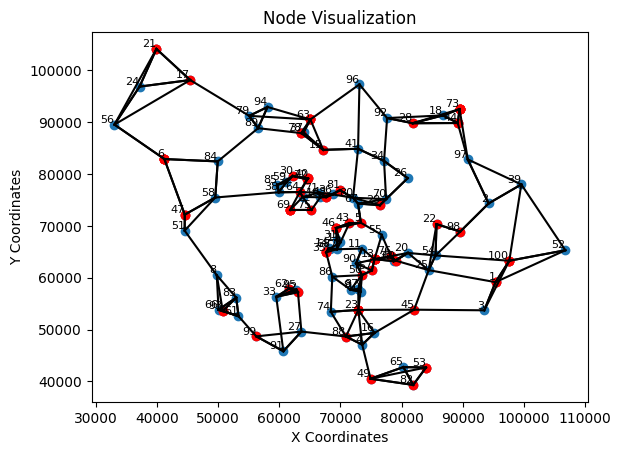

84


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


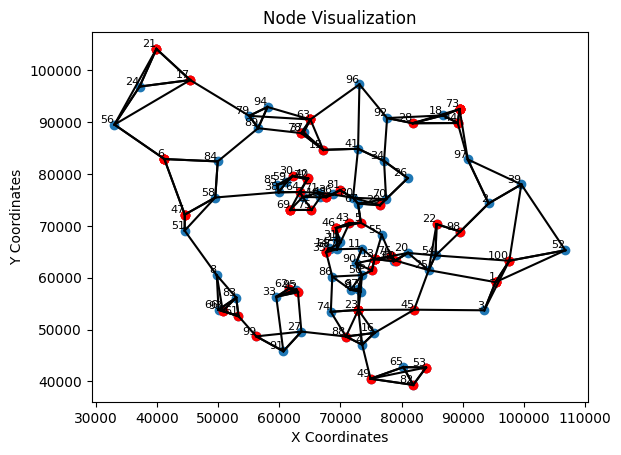

85


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


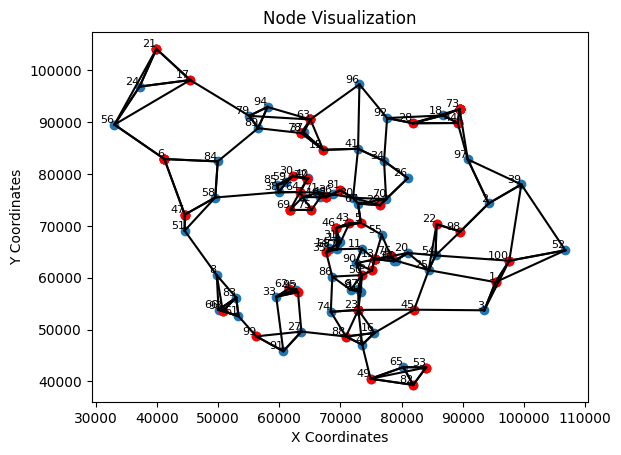

86


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


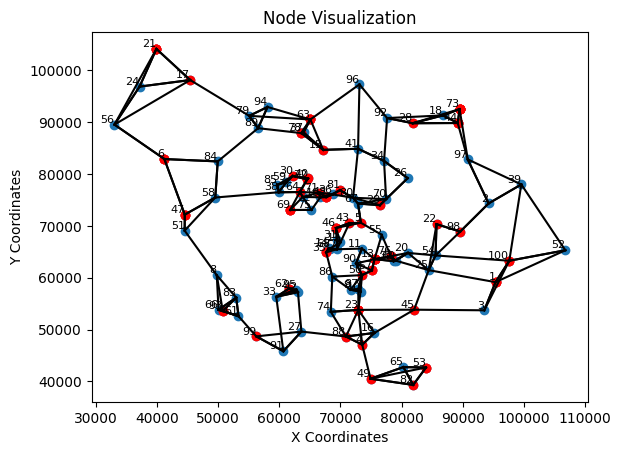

87


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


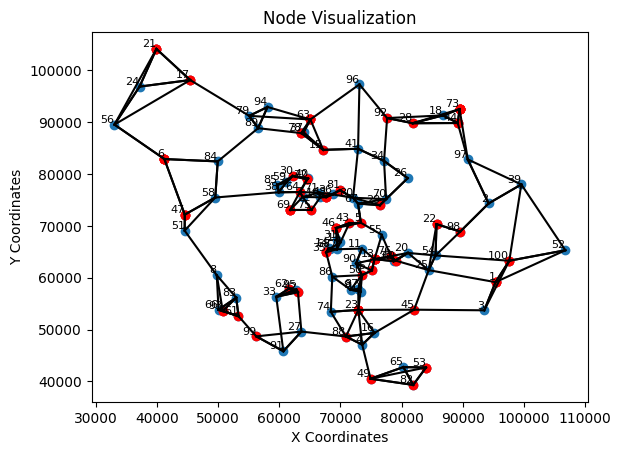

88


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


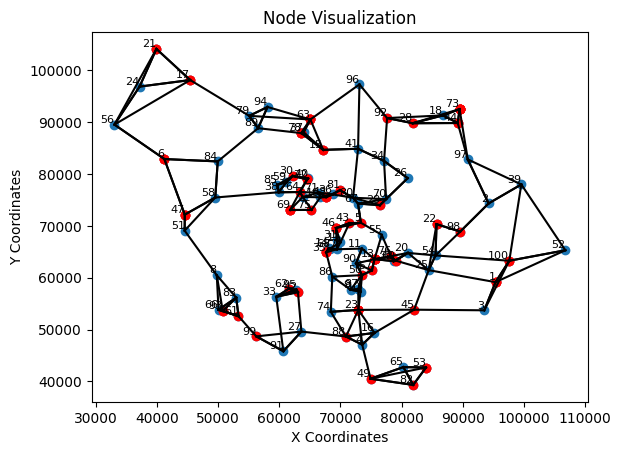

89


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


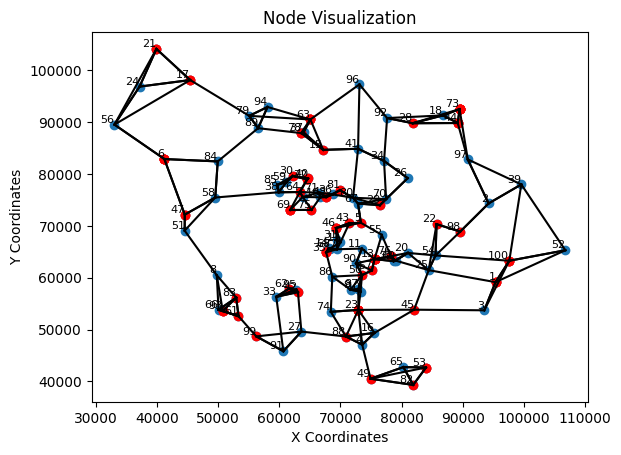

90


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


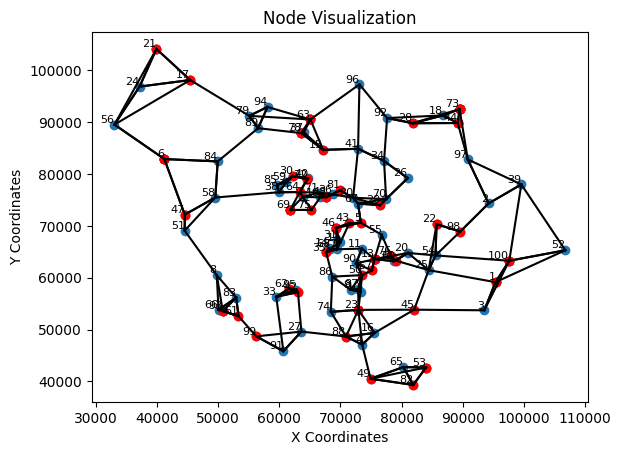

91


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


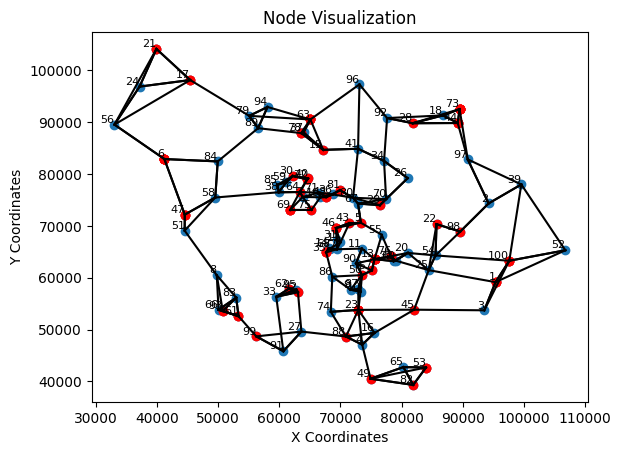

92


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


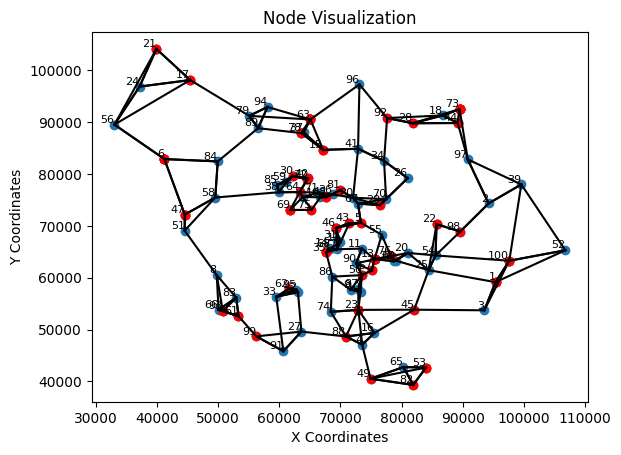

93


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


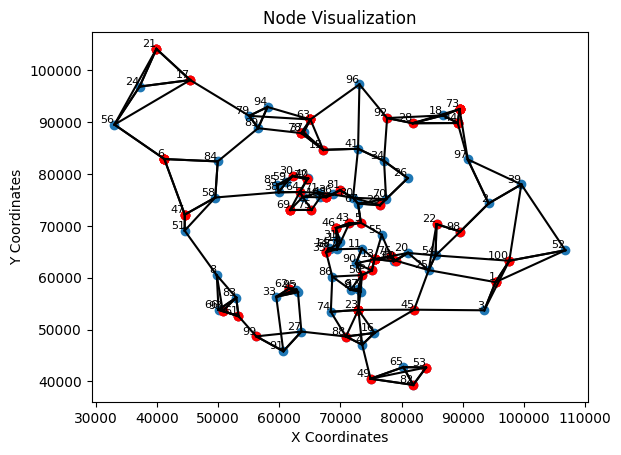

94


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


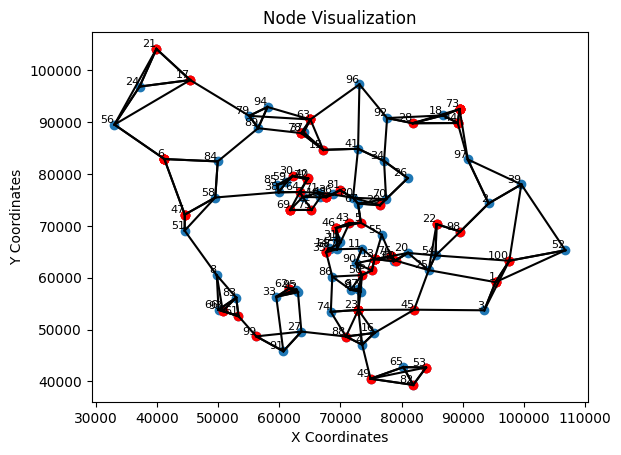

95


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


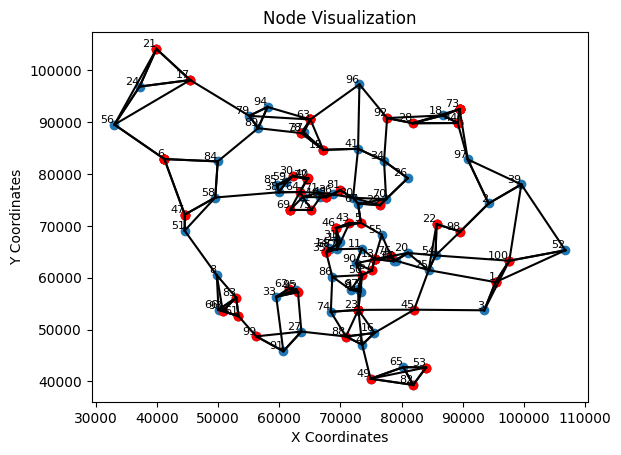

96


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


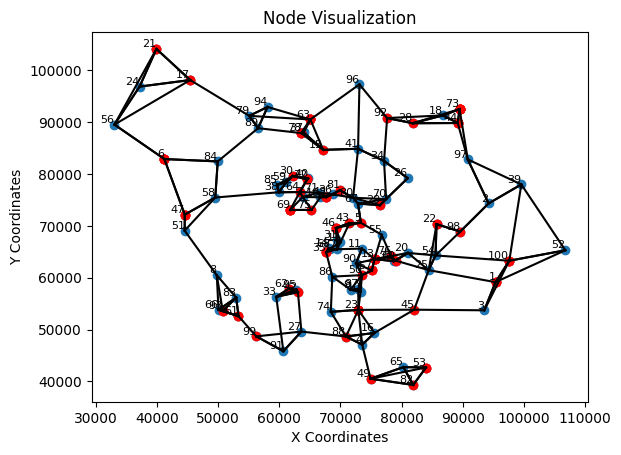

97


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


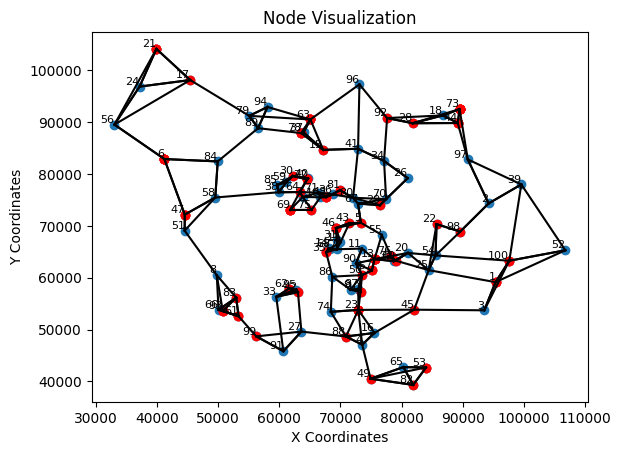

98


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


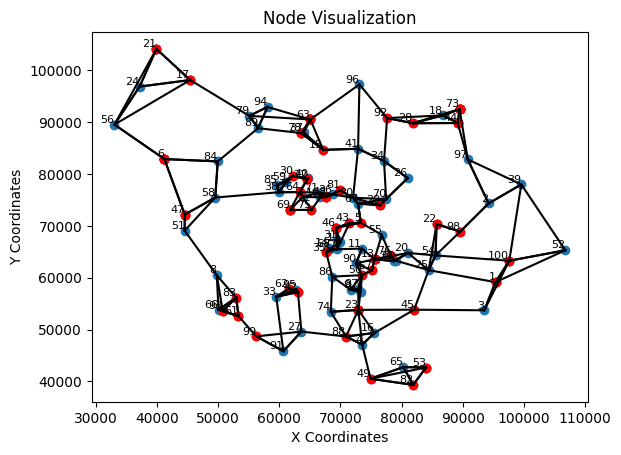

99


C:\Users\PC-1\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\PC-1\AppData\Local\Temp\ipykernel_11744\1976436531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viable_routes_df['cluster'] = kmeans.labels_


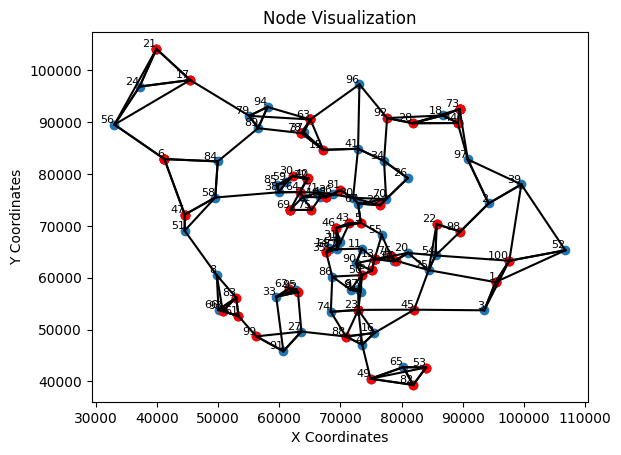

100


In [111]:
graph_40000 = dict()
for i in range(100):
    graph_40000[i+1] = fff(40000,i+1)

<function matplotlib.pyplot.show(close=None, block=None)>

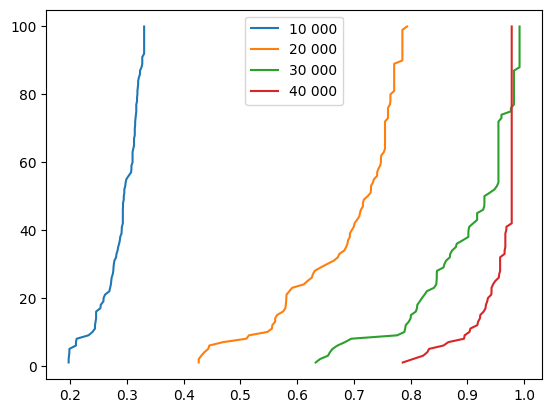

In [112]:
plt.plot(sorted(graph_10000.values()), graph_10000.keys(), label = '10 000')
plt.plot(sorted(graph_20000.values()), graph_20000.keys(), label = '20 000')
plt.plot(sorted(graph_30000.values()), graph_30000.keys(), label = '30 000')
plt.plot(sorted(graph_40000.values()), graph_40000.keys(), label = '40 000')
plt.legend()
plt.show

In [105]:
df = pd.DataFrame()

In [106]:
df['Number of stations'] = graph_10000.keys()

In [113]:
df['40 000'] = graph_40000.values()

In [118]:
df.to_excel('Video to frames/data.xlsx')

OSError: Cannot save file into a non-existent directory: 'Video to frames'